# EEG Analysis Pipeline

This notebook processes EEG data from XDF format through preprocessing, artifact removal, ICA decomposition, frequency deco position, epoching and ERDS calculation.

## 1. Setup and Import Libraries

In [1]:
#importing the packages
import mne
import pyxdf
import sklearn
from autoreject import compute_thresholds, RejectLog
import seaborn as sns
import statsmodels


import os
import numpy as np
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
from pathlib import Path
import re
import pickle
from scipy.signal import firwin
from mne.time_frequency import psd_array_welch
import json
from typing import Dict
import glob
import traceback
import matplotlib

from scipy.stats import linregress
from scipy import stats
from scipy.stats import f_oneway, ttest_rel, ttest_ind
from statsmodels.stats.anova import AnovaRM
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statsmodels.regression.mixed_linear_model import MixedLM

import itertools

### 1.2 Save and Load Data

In [ ]:
def save_all_processed_data(processed_data, 
                            output_dir='/work/BSc_Project/preprocessed_data', 
                            output_file='processed_data_complete.pkl'):
    """
    Save EVERYTHING in your processed_data dictionary.
    """
    
    print(f"\n{'='*60}")
    print(f"SAVING COMPLETE PROCESSED DATA")
    print(f"{'='*60}\n")
    
    #create directory if doesn't exist
    os.makedirs(output_dir, exist_ok=True)
    full_path = os.path.join(output_dir, output_file)
    
    #prepare data to save
    save_dict = {}
    total_keys = 0
    
    for participant_id, data in processed_data.items():
        #copy all data for a participant
        save_dict[participant_id] = dict(data)
        total_keys += len(data)
        
        #list keys for a participant
        keys_list = list(data.keys())
        print(f"[{participant_id}] Saving {len(data)} objects:")
        print(f"  {', '.join(keys_list)}")
    
    #save to a pickle file
    try:
        print(f"\nSaving to: {full_path}")
        with open(full_path, 'wb') as f:
            pickle.dump(save_dict, f, protocol=pickle.HIGHEST_PROTOCOL)
        
        file_size_mb = os.path.getsize(full_path) / (1024 * 1024)
        
        print(f"\n{'='*60}")
        print(f"✓ SAVE COMPLETE!")
        print(f"{'='*60}")
        print(f"✓ Saved {len(save_dict)} participants")
        print(f"✓ Total data objects saved: {total_keys}")
        print(f"✓ File location: {full_path}")
        print(f"✓ File size: {file_size_mb:.2f} MB")
        print(f"{'='*60}\n")
        
        return full_path
        
    except Exception as e:
        print(f"\n❌ Error saving: {e}")
        traceback.print_exc()
        return None


#saving all the data
save_all_processed_data(processed_data)


SAVING COMPLETE PROCESSED DATA

[P321] Saving 40 objects:
  file_path, raw, epochs, ica, events, event_id, marker_descriptions, raw_preprocessed, raw_clean, block_info, epochs_clean, excluded_components, preprocessed_raw_ica, raw_alpha, raw_low_beta, raw_high_beta, raw_low_beta_amplitude, raw_high_beta_amplitude, raw_alpha_amplitude, cue_alpha_binned_erd, cue_alpha_info, cue_alpha_reject_info, move_alpha_binned_erd, move_alpha_info, move_alpha_reject_info, alpha_bin_centers, cue_low_beta_binned_erd, cue_low_beta_info, cue_low_beta_reject_info, move_low_beta_binned_erd, move_low_beta_info, move_low_beta_reject_info, low_beta_bin_centers, cue_high_beta_binned_erd, cue_high_beta_info, cue_high_beta_reject_info, move_high_beta_binned_erd, move_high_beta_info, move_high_beta_reject_info, high_beta_bin_centers
[P144] Saving 40 objects:
  file_path, raw, epochs, ica, events, event_id, marker_descriptions, raw_preprocessed, raw_clean, block_info, epochs_clean, excluded_components, preprocesse

'/work/BSc_Project/preprocessed_data/processed_data_complete.pkl'

In [ ]:
def load_all_processed_data(file_path='/work/BSc_Project/preprocessed_data/processed_data_complete.pkl'):
    """
    Load the complete processed data file.
    """
    
    print(f"\n{'='*60}")
    print(f"LOADING COMPLETE PROCESSED DATA")
    print(f"{'='*60}\n")
    
    if not os.path.exists(file_path):
        print(f"❌ ERROR: File not found: {file_path}")
        return None
    
    try:
        print(f"Loading from: {file_path}")
        
        with open(file_path, 'rb') as f:
            processed_data = pickle.load(f)
        
        file_size_mb = os.path.getsize(file_path) / (1024 * 1024)
        
        print(f"\n{'='*60}")
        print(f"✓ LOAD COMPLETE")
        print(f"{'='*60}")
        print(f"✓ Loaded {len(processed_data)} participants")
        print(f"✓ File size: {file_size_mb:.2f} MB\n")
        
        #show keys for each participant
        for participant_id, data in processed_data.items():
            n_keys = len(data)
            keys_preview = ', '.join(list(data.keys())[:5])
            if n_keys > 5:
                keys_preview += '...'
            print(f"  [{participant_id}] {n_keys} objects: {keys_preview}")
        
        print(f"\n{'='*60}\n")
        
        return processed_data
        
    except Exception as e:
        print(f"\n❌ Error loading: {e}")
        traceback.print_exc()
        return None

#loading the data
processed_data = load_all_processed_data('/work/BSc_Project/preprocessed_data/processed_data_complete.pkl')


LOADING COMPLETE PROCESSED DATA

Loading from: /work/BSc_Project/preprocessed_data/processed_data_complete.pkl

✓ LOAD COMPLETE
✓ Loaded 4 participants
✓ File size: 2134.23 MB

  [P321] 40 objects: file_path, raw, epochs, ica, events...
  [P144] 40 objects: file_path, raw, epochs, ica, events...
  [P295] 40 objects: file_path, raw, epochs, ica, events...
  [P657] 40 objects: file_path, raw, epochs, ica, events...




## 2. Define File Paths and Setup Processing Loop

In [ ]:
#file paths to process (xdf files)
file_paths = [
    "/work/BSc_Project/data_analysis/eeg_data/sub-P321/ses-S001/eeg/sub-P321_ses-S001_task-Default_run-001_eeg.xdf",
    "/work/BSc_Project/data_analysis/eeg_data/sub-P144/ses-S001/eeg/sub-P144_ses-S001_task-Default_run-001_eeg.xdf",
    "/work/BSc_Project/data_analysis/eeg_data/sub-P295/ses-S001/eeg/sub-P295_ses-S001_task-Default_run-001_eeg.xdf",
    "/work/BSc_Project/data_analysis/eeg_data/sub-P657/ses-S001/eeg/sub-P657_ses-S001_task-Default_run-001_eeg.xdf",
]

### Create Processing Dictionary

In [ ]:
#dictionary to store processed data for each participant
processed_data = {}

#loop through all files
for file_idx, file_path in enumerate(file_paths):
    participant_id = f"P{file_idx + 1}" 
    #extract participat id from path
    match = re.search(r'sub-(P\d+)', file_path)
    if match:
        participant_id = match.group(1)
    
    print(f"\n{'='*60}")
    print(f"Processing {participant_id}: {file_path}")
    print(f"{'='*60}\n")
    
    #strore intitial info in the dict
    processed_data[participant_id] = {
        'file_path': file_path,
        'raw': None,
        'epochs': None,
        'ica': None
    }


Processing P321: /work/BSc_Project/data_analysis/eeg_data/sub-P321/ses-S001/eeg/sub-P321_ses-S001_task-Default_run-001_eeg.xdf


Processing P144: /work/BSc_Project/data_analysis/eeg_data/sub-P144/ses-S001/eeg/sub-P144_ses-S001_task-Default_run-001_eeg.xdf


Processing P295: /work/BSc_Project/data_analysis/eeg_data/sub-P295/ses-S001/eeg/sub-P295_ses-S001_task-Default_run-001_eeg.xdf


Processing P657: /work/BSc_Project/data_analysis/eeg_data/sub-P657/ses-S001/eeg/sub-P657_ses-S001_task-Default_run-001_eeg.xdf



### Load XDF Data for All Participants

In [ ]:
for participant_id in processed_data.keys():
    file_path = processed_data[participant_id]['file_path']
    
    try:
        #1. load xdf files
        streams, header = pyxdf.load_xdf(file_path)

        #2. identify ane extract eeg and psychopy streams
        eeg_stream = None
        marker_stream = None

        for s in streams:
            if s['info']['type'][0] == 'EEG': #openbci eeg 
                eeg_stream = s
            elif s['info']['type'][0] == 'Markers':  #psychopy markers 
                marker_stream = s

        if eeg_stream is None:
            raise ValueError("Could not find an EEG stream in the XDF file.")
        if marker_stream is None:
            raise ValueError("Could not find a Marker/Events stream in the XDF file.")

        #3. prepare data for mne

        #convert to numpy arrays
        eeg_timestamps = np.asarray(eeg_stream.get("time_stamps", []), dtype=float)
        eeg_samples = np.asarray(eeg_stream.get("time_series", []), dtype=float)

        #determine orientation of eeg samples and transpose if needed
        if eeg_samples.ndim == 2 and eeg_timestamps.size == eeg_samples.shape[0]:
            eeg_data = eeg_samples.T  # -> (n_channels, n_samples)
        elif eeg_samples.ndim == 2 and eeg_timestamps.size == eeg_samples.shape[1]:
            eeg_data = eeg_samples  # already (n_channels, n_samples)
        else:
            eeg_data = eeg_samples.T if eeg_samples.ndim == 2 and eeg_samples.shape[0] < eeg_samples.shape[1] else eeg_samples

        #ensure float and apply unit conversion
        eeg_scale = 1e-6 #no pre amp gain as it is added online
        eeg_data = eeg_data.astype(float)
        eeg_data *= eeg_scale  #apply to all channels

        #sampling frequency
        sfreq = float(eeg_stream["info"]["nominal_srate"][0])

        n_eeg_channels = eeg_data.shape[0]
        ch_names = [f"EEG {i+1:02d}" for i in range(n_eeg_channels)]
        ch_types = ["eeg"] * n_eeg_channels

        info = mne.create_info(ch_names=ch_names, sfreq=sfreq, ch_types=ch_types)
        raw = mne.io.RawArray(eeg_data, info, verbose=False)
        print(f"[{participant_id}] Created MNE Raw object with {n_eeg_channels} channels at {sfreq} Hz.")

        #4. add markers as mne annotations

        marker_timestamps = np.asarray(marker_stream.get("time_stamps", []), dtype=float)
        marker_vals_raw = np.asarray(marker_stream.get("time_series", []), dtype=object)

        #reduce marker_vals to 1d
        if marker_vals_raw.ndim == 2 and marker_vals_raw.shape[1] >= 1:
            marker_vals = marker_vals_raw[:, 0]
        else:
            marker_vals = marker_vals_raw.ravel()

        #unwrap single-element arrays, decode bytes, convert to strings
        marker_descriptions = []
        for v in marker_vals:
            if isinstance(v, np.ndarray) and v.size == 1:
                v = v.item()
            elif isinstance(v, (list, tuple)) and len(v) == 1:
                v = v[0]

            if isinstance(v, (bytes, bytearray)):
                try:
                    v = v.decode("utf-8")
                except Exception:
                    v = v.decode("latin-1", errors="ignore")

            marker_descriptions.append(str(v))

        #align marker timestamps to eeg timebase
        if eeg_timestamps.size > 0 and marker_timestamps.size > 0:
            onsets = (marker_timestamps - eeg_timestamps[0]).astype(float)
        elif marker_timestamps.size > 0:
            onsets = (marker_timestamps - marker_timestamps[0]).astype(float)
        else:
            onsets = np.array([], dtype=float)

        #ensure descriptions and onsets are the same length
        if len(marker_descriptions) != len(onsets):
            min_len = min(len(marker_descriptions), len(onsets))
            marker_descriptions = marker_descriptions[:min_len]
            onsets = onsets[:min_len]

        durations = np.zeros_like(onsets, dtype=float)

        #attach annotaions to raw
        annotations = mne.Annotations(onset=onsets.tolist(),
                                      duration=durations.tolist(),
                                      description=marker_descriptions)
        raw.set_annotations(annotations)

        print(f"[{participant_id}] Total Markers loaded: {len(raw.annotations)}")

        #convert annotations to events for epoching
        unique_labels = list(dict.fromkeys(marker_descriptions))
        event_id = {label: idx + 1 for idx, label in enumerate(unique_labels)}
        events, event_id_out = mne.events_from_annotations(raw, event_id=event_id)

        #5. store in dict
        processed_data[participant_id]['raw'] = raw
        processed_data[participant_id]['events'] = events
        processed_data[participant_id]['event_id'] = event_id_out
        processed_data[participant_id]['marker_descriptions'] = marker_descriptions
        
        print(f"[{participant_id}] ✓ Loading complete\n")

    except FileNotFoundError:
        print(f"[{participant_id}] ERROR: File not found at {file_path}")
    except ValueError as e:
        print(f"[{participant_id}] ERROR: {e}")
    except Exception as e:
        print(f"[{participant_id}] ERROR: An unexpected error occurred: {e}")

print(f"\n{'='*60}")
print(f"Successfully loaded {len([p for p in processed_data.values() if p['raw'] is not None])} / {len(processed_data)} files")
print(f"{'='*60}")

[P321] Created MNE Raw object with 16 channels at 125.0 Hz.
[P321] Total Markers loaded: 1750
Used Annotations descriptions: [np.str_('BLANK_SCREEN_PRE_CUE_010'), np.str_('BLANK_SCREEN_PRE_CUE_011'), np.str_('BLANK_SCREEN_PRE_CUE_020'), np.str_('BLANK_SCREEN_PRE_CUE_021'), np.str_('BLANK_SCREEN_PRE_CUE_050'), np.str_('BLANK_SCREEN_PRE_CUE_051'), np.str_('BLANK_SCREEN_PRE_CUE_110'), np.str_('BLANK_SCREEN_PRE_CUE_111'), np.str_('BLANK_SCREEN_PRE_CUE_120'), np.str_('BLANK_SCREEN_PRE_CUE_121'), np.str_('BLANK_SCREEN_PRE_CUE_150'), np.str_('BLANK_SCREEN_PRE_CUE_151'), np.str_('BLOCK_0_END'), np.str_('BLOCK_0_START_PRACTICE'), np.str_('BLOCK_1_END'), np.str_('BLOCK_1_START_NON_SOCIAL'), np.str_('BLOCK_2_END'), np.str_('BLOCK_2_START_SOCIAL'), np.str_('BLOCK_3_END'), np.str_('BLOCK_3_START_NON_SOCIAL'), np.str_('BLOCK_4_END'), np.str_('BLOCK_4_START_SOCIAL'), np.str_('BLOCK_5_END'), np.str_('BLOCK_5_START_NON_SOCIAL'), np.str_('BLOCK_6_START_SOCIAL'), np.str_('CIRCLE_EXIT'), np.str_('CUE_SHOW

/tmp/ipykernel_794/1723594691.py:100: RuntimeWarning: Omitted 789 annotation(s) that were outside data range.
  raw.set_annotations(annotations)


[P144] Created MNE Raw object with 16 channels at 125.0 Hz.
[P144] Total Markers loaded: 2539
Used Annotations descriptions: [np.str_('BLANK_SCREEN_PRE_CUE_010'), np.str_('BLANK_SCREEN_PRE_CUE_011'), np.str_('BLANK_SCREEN_PRE_CUE_020'), np.str_('BLANK_SCREEN_PRE_CUE_021'), np.str_('BLANK_SCREEN_PRE_CUE_050'), np.str_('BLANK_SCREEN_PRE_CUE_051'), np.str_('BLANK_SCREEN_PRE_CUE_110'), np.str_('BLANK_SCREEN_PRE_CUE_111'), np.str_('BLANK_SCREEN_PRE_CUE_120'), np.str_('BLANK_SCREEN_PRE_CUE_121'), np.str_('BLANK_SCREEN_PRE_CUE_150'), np.str_('BLANK_SCREEN_PRE_CUE_151'), np.str_('BLOCK_0_END'), np.str_('BLOCK_0_START_PRACTICE'), np.str_('BLOCK_1_END'), np.str_('BLOCK_1_START_NON_SOCIAL'), np.str_('BLOCK_2_END'), np.str_('BLOCK_2_START_SOCIAL'), np.str_('BLOCK_3_END'), np.str_('BLOCK_3_START_NON_SOCIAL'), np.str_('BLOCK_4_END'), np.str_('BLOCK_4_START_SOCIAL'), np.str_('BLOCK_5_END'), np.str_('BLOCK_5_START_NON_SOCIAL'), np.str_('BLOCK_6_END'), np.str_('BLOCK_6_START_SOCIAL'), np.str_('BLOCK_7_

## 3. Initial Data Inspection

### Timestamp Diagnostics

In [ ]:
for participant_id in processed_data.keys():

    print(f"\n{'='*60}")
    print(f"DIAGNOSTICS: {participant_id}")
    print(f"{'='*60}")
    
    #load stream and timestamps for diagnostics
    raw = processed_data[participant_id]['raw']
    if raw is None:
        print(f"[{participant_id}] Skipping diagnostics due to loading error.")
        continue 

    eeg_stream = raw.get_data()
    marker_stream = raw.annotations

    eeg_timestamps = np.arange(raw.n_times) / raw.info['sfreq'] + raw.first_time
    marker_timestamps = marker_stream.onset + raw.first_time

    print("=== Timestamp Diagnostics ===")
    print(f"EEG timestamps:    n={len(eeg_timestamps)}")
    if len(eeg_timestamps) > 0:
        print(f"  Range: {eeg_timestamps[0]:.6f} to {eeg_timestamps[-1]:.6f}")
        print(f"  Duration: {eeg_timestamps[-1] - eeg_timestamps[0]:.3f} s")
    print(f"\nMarker timestamps: n={len(marker_timestamps)}")
    if len(marker_timestamps) > 0:
        print(f"  Range: {marker_timestamps[0]:.6f} to {marker_timestamps[-1]:.6f}")
        print(f"  Duration: {marker_timestamps[-1] - marker_timestamps[0]:.3f} s")


    #check alignment of first and last timestamps
    if len(eeg_timestamps) > 0 and len(marker_timestamps) > 0:
        print(f"\nTime difference between first EEG and first marker: {marker_timestamps[0] - eeg_timestamps[0]:.3f} s")
        print(f"Time difference between last EEG and last marker: {marker_timestamps[-1] - eeg_timestamps[-1]:.3f} s")
    
    #compute onsets relative to raw timebase
    onsets = marker_timestamps - eeg_timestamps[0]
    print(f"\nOnsets after alignment (marker_ts - eeg_ts[0]):")
    print(f"  Range: {onsets. min():.3f} to {onsets.max():.3f} s")
    print(f"  First 5 onsets: {onsets[:5]}")
    print(f"  Last 5 onsets: {onsets[-5:]}")
    
    #check for markers outside the raw duration
    raw_duration = (eeg_timestamps[-1] - eeg_timestamps[0])
    outside = np.sum((onsets < 0) | (onsets > raw_duration))
    print(f"\nMarkers outside [0, {raw_duration:.3f}] s: {outside} / {len(onsets)}")
    print(f"  Before 0: {np.sum(onsets < 0)}")
    print(f"  After {raw_duration:.3f}: {np.sum(onsets > raw_duration)}")

=== Timestamp Diagnostics ===
EEG timestamps:    n=280440
  Range: 458865.990172 to 461105.284354
  Duration: 2239.294 s

Marker timestamps: n=2531
  Range: 459077.023137 to 461078.705848
  Duration: 2001.683 s

Time difference between first EEG and first marker: 211.033 s
Time difference between last EEG and last marker: -26.579 s

Onsets after alignment (marker_ts - eeg_ts[0]):
  Range: 211.033 to 2212.716 s
  First 5 onsets: [211.03296536 211.14218648 211.14219798 214.25579137 214.77453046]
  Last 5 onsets: [2209.53719263 2210.10436522 2210.11709451 2210.11722376 2212.7156761 ]

Markers outside [0, 2239.294] s: 0 / 2531
  Before 0: 0
  After 2239.294: 0


### Raw Data Information

In [ ]:
for participant_id in processed_data.keys():
    
    #load raw for diagnostics   
    raw = processed_data[participant_id]['raw']
    if raw is None:
        print(f"[{participant_id}] Skipping diagnostics due to loading error.")
        continue 

    #inspection of the raw info and data
    print("sfreq:", raw.info['sfreq'])
    print("n_channels:", len(raw.ch_names))
    print("first channel names:", raw.ch_names[:])

    data = raw.get_data()   # shape (n_channels, n_samples)
    print("data.shape (n_channels, n_samples):", data.shape)
    print("dtype:", data.dtype)

    #basic stats for channels
    for i in range(min(16, data.shape[0])):
        ch = raw.ch_names[i]
        chmin, chmax, chstd = np.min(data[i]), np.max(data[i]), np.std(data[i])
        print(f"ch {i:02d} {ch}: min={chmin:.3e}, max={chmax:.3e}, std={chstd:.3e}")
        
    for i in range(min(3, data.shape[0])):
        print(f"ch {i} first 20 samples:", data[i, :20]) 

sfreq: 125.0
n_channels: 16
first channel names: ['EEG 01', 'EEG 02', 'EEG 03', 'EEG 04', 'EEG 05', 'EEG 06', 'EEG 07', 'EEG 08', 'EEG 09', 'EEG 10', 'EEG 11', 'EEG 12', 'EEG 13', 'EEG 14', 'EEG 15', 'EEG 16']
data.shape (n_channels, n_samples): (16, 280440)
dtype: float64
ch 00 EEG 01: min=5.152e-02, max=5.718e-02, std=1.142e-03
ch 01 EEG 02: min=1.239e-01, max=1.758e-01, std=1.497e-02
ch 02 EEG 03: min=-1.268e-02, max=-9.857e-04, std=1.488e-03
ch 03 EEG 04: min=-3.413e-02, max=-2.040e-02, std=4.153e-03
ch 04 EEG 05: min=-5.301e-03, max=5.236e-03, std=3.363e-03
ch 05 EEG 06: min=-2.657e-03, max=6.160e-03, std=2.468e-03
ch 06 EEG 07: min=-9.797e-03, max=2.924e-03, std=3.797e-03
ch 07 EEG 08: min=-1.644e-02, max=3.442e-03, std=5.934e-03
ch 08 EEG 09: min=3.555e-02, max=5.497e-02, std=3.616e-03
ch 09 EEG 10: min=-1.293e-02, max=7.660e-03, std=5.686e-03
ch 10 EEG 11: min=2.790e-02, max=4.260e-02, std=1.841e-03
ch 11 EEG 12: min=2.779e-02, max=4.294e-02, std=4.418e-03
ch 12 EEG 13: min=1.3

### Visual Inspection of Raw Signal

Using matplotlib as 2D backend.


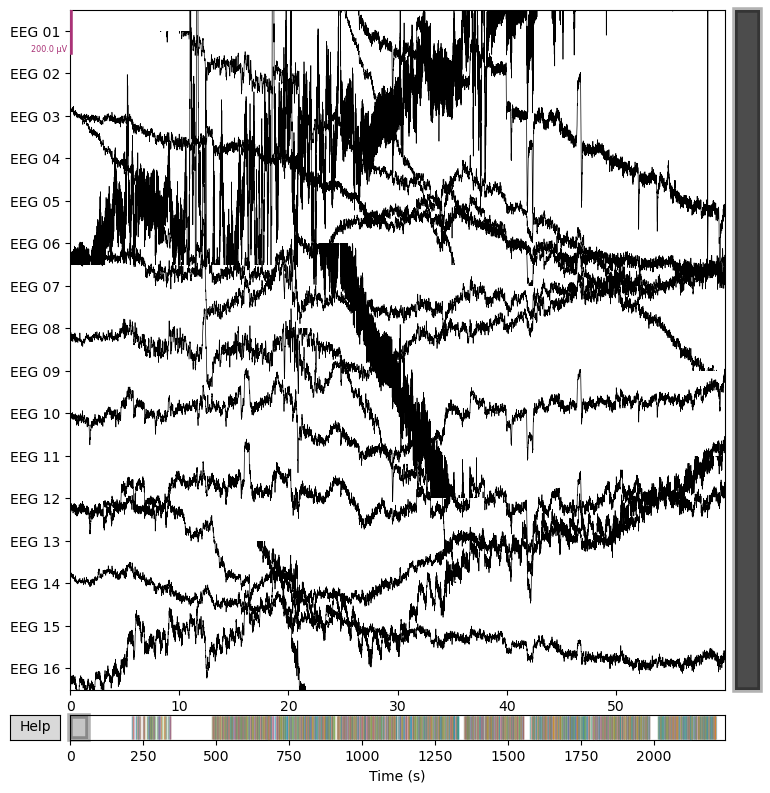

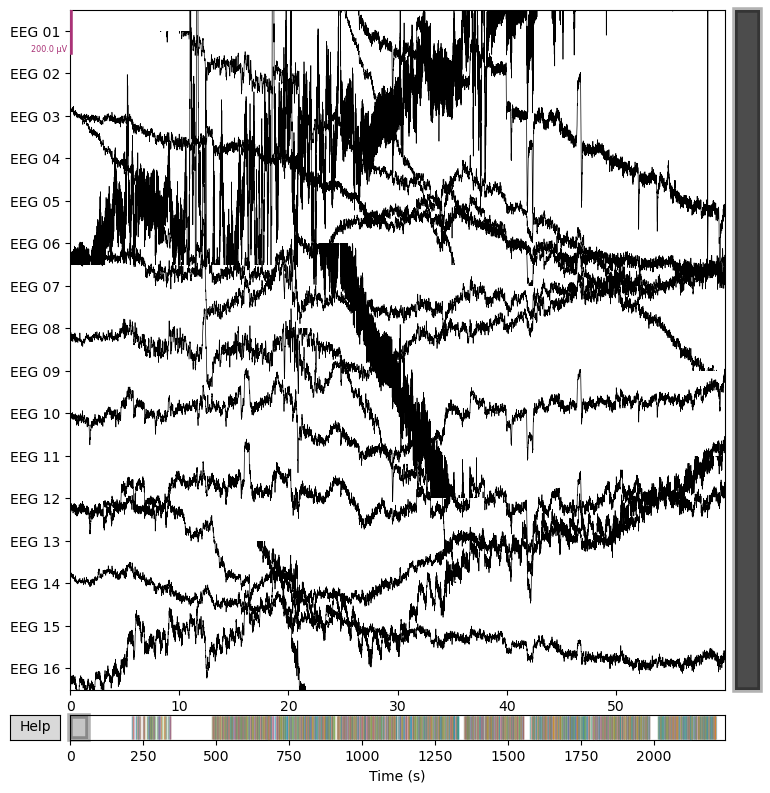

In [ ]:
#visual check of the signal (single participant)
raw = processed_data['P144']['raw']
raw.plot(duration = 60, scalings={'eeg': 100e-6}, show=True, block=False)

### Check Triggers/Events

  'BLOCK_0_START_PRACTICE': 1
  'TRIAL_START_011': 22
  'FIX_CROSS_011': 21
  'BLANK_SCREEN_PRE_CUE_011': 21
  'CUE_SHOW_011': 21
  'MOVE_START_011': 21
  'MOVE_END_011': 21
  'MOVEMENT_CUE': 126
  'CIRCLE_EXIT': 126
  'RETRIEVAL_START': 124
  'TRIAL_END_011': 21
  'TRIAL_START_150': 21
  'FIX_CROSS_150': 21
  'BLANK_SCREEN_PRE_CUE_150': 21
  'CUE_SHOW_150': 21
  'MOVE_START_150': 21
  'MOVE_END_150': 21
  'S_RETURN_START': 63
  'S_RETURN_END': 63
  'TRIAL_END_150': 21
  'TRIAL_START_121': 21
  'FIX_CROSS_121': 21
  'BLANK_SCREEN_PRE_CUE_121': 21
  'CUE_SHOW_121': 21
  'MOVE_START_121': 21
  'MOVE_END_121': 21
  'TRIAL_END_121': 21
  'TRIAL_START_151': 21
  'FIX_CROSS_151': 21
  'BLANK_SCREEN_PRE_CUE_151': 21
  'CUE_SHOW_151': 21
  'MOVE_START_151': 21
  'MOVE_END_151': 21
  'TRIAL_END_151': 21
  'TRIAL_START_050': 21
  'FIX_CROSS_050': 21
  'BLANK_SCREEN_PRE_CUE_050': 21
  'CUE_SHOW_050': 21
  'MOVE_START_050': 21
  'MOVE_END_050': 21
  'NS_RETURN_START': 63
  'NS_RETURN_END': 63
  'T

/tmp/ipykernel_849/1551293588.py:7: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  mne.viz.plot_events(events)


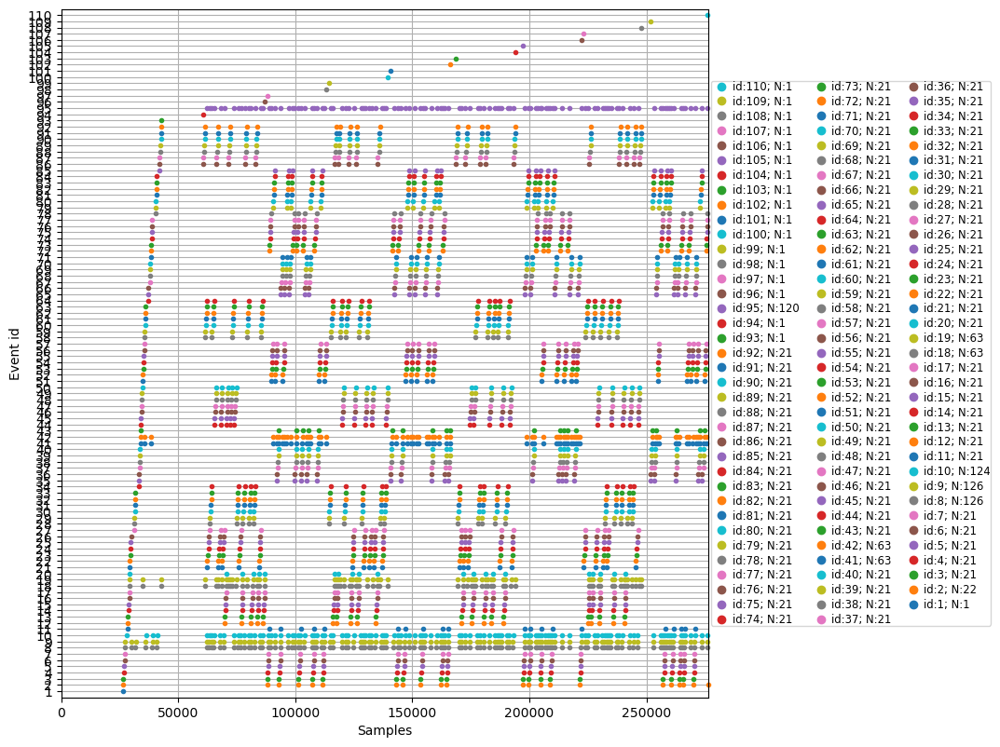

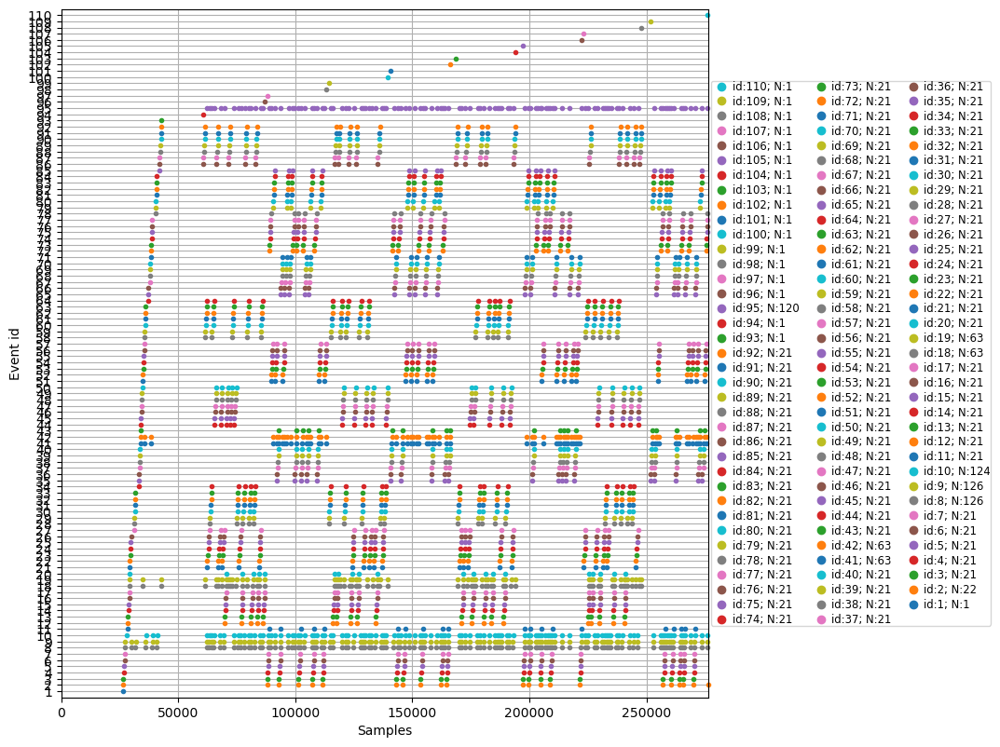

In [ ]:
#unique triggers (single participant)
marker_descriptions = processed_data['P144']['marker_descriptions'] 

for label, cnt in Counter(marker_descriptions).items():
    print(f"  {label!r}: {cnt}")

#visualisation of timing of triggers
events = processed_data['P144']['events']
mne.viz.plot_events(events)

## 4. Preprocessing Pipeline

### Define Preprocessing Function

In [ ]:
def preprocess_participant(raw, participant_id, 
                          apply_car=False, 
                          highpass=1, lowpass=40, notch_freq=25,
                          target_labels=['Fp1', 'Fp2', 'C3', 'C4', 'P7', 'P8', 'O1', 'O2', 
                                       'F7', 'F8', 'F3', 'F4', 'T7', 'T8', 'P3', 'P4']):
    """
    Preprocess a single participant's raw EEG data.
    """
    
    print(f"\n[{participant_id}] Starting preprocessing...")
    
    raw = raw.copy()  #work on a copy
    
    # 1. Identify bad channels
    stds = np.std(raw.get_data(), axis=1)
    flat_thresh = 1e-12
    large_thresh = 1e-2
    
    bads = []
    for i, ch in enumerate(raw.ch_names):
        if stds[i] <= flat_thresh or stds[i] >= large_thresh:
            bads.append(ch)
    
    bads = list(dict.fromkeys(bads))
    raw.info['bads'] = bads
        
    print(f"[{participant_id}] Marked {len(bads)} bad channels: {bads}")
    
    #drop bad channels (low density array -> no interpolation)
    if len(bads) > 0:
        raw.drop_channels(bads)
    print(f"[{participant_id}] Dropped {len(bads)} bad channels")
    
    # 2. Apply common average reference (not implemented: low density array -> no rereferencing)
    if apply_car:
        raw.set_eeg_reference('average', projection= True) #applying CAR rereferencing
        raw.apply_proj()
        print(f"[{participant_id}] Applied CAR")
    
    # 3. High-pass and low-pass filters
    raw.filter(l_freq=highpass,
           h_freq=None,
           picks='eeg',
           filter_length=825,
           fir_design='firwin',
           fir_window='hamming',
           l_trans_bandwidth=0.5,
           phase='zero',
           verbose=None)
    
    raw.filter(l_freq=None,
           h_freq=lowpass,
           picks='eeg',
           filter_length=1651,        #number of FIR taps
           fir_design='firwin',
           fir_window='hamming',
           h_trans_bandwidth=5.0,
           phase='zero',
           verbose=None)
    
    print(f"[{participant_id}] Applied bandpass filter: {highpass}-{lowpass} Hz")
    
    # 4. Notch filter
    if notch_freq is not None:
        raw.notch_filter(freqs=25, picks='eeg', method='fir', #noise at 25 in all participants
                         notch_widths=0.5, fir_design='firwin',
                         phase='zero', verbose=False)
        print(f"[{participant_id}] Applied notch filter at {notch_freq} Hz")
        
    #notch filter for powerline noise
    raw.notch_filter(freqs=50, picks='eeg', method='fir',
                 notch_widths=2, fir_design='firwin',
                 phase='zero', verbose=False)
    
    # 5. Rename channels to standard 10-20
    raw_chs = raw.ch_names.copy()
    n_raw = len(raw_chs)
    n_target = len(target_labels)
    
    #numeric-name matching
    numeric_matches = {}
    for ch in raw_chs:
        m = re.search(r'EEG\s*0*([1-9]\d*)\s*$', ch, flags=re.IGNORECASE)
        if m:
            idx = int(m.group(1))
            numeric_matches[ch] = idx
    
    mapping = {}
    if len(numeric_matches) == n_raw and all(1 <= v <= n_target for v in numeric_matches.values()):
        for old_name, idx in numeric_matches.items():
            new_name = target_labels[idx - 1]
            mapping[old_name] = new_name
    elif n_raw == n_target:
        for old_name, new_name in zip(raw_chs, target_labels):
            mapping[old_name] = new_name
    else:
        print(f"[{participant_id}] WARNING: Cannot rename channels automatically")
        return raw
    
    raw.rename_channels(mapping)
    set_types = {lbl: "eeg" for lbl in mapping.values()}
    raw.set_channel_types(set_types)
    
    # 5. Attach montage
    montage = mne.channels.make_standard_montage("standard_1020")
    raw.set_montage(montage, on_missing="warn")

    #participant 144 -> additional bad channel (not detected by std method)
    if participant_id == "P144":
        raw.info['bads'].append('Fp2')
        raw.drop_channels(['Fp2'])

    
    print(f"[{participant_id}] ✓ Preprocessing complete")
    
    return raw

### Apply Preprocessing and Save the Data for All Participants

In [ ]:
#output directory for preprocessed data
OUTPUT_DIR = Path("/work/BSc_Project/data_analysis/preprocessed_output")
OUTPUT_DIR.mkdir(exist_ok=True, parents=True)

print(f"\n{'='*60}")
print("Preprocessing and saving all participants")
print(f"{'='*60}\n")

#combined preprocessing and saving loop
for participant_id, data in processed_data.items():
    
    if data['raw'] is None:
        print(f"[{participant_id}] Skipping - no raw data")
        continue
    
    print(f"[{participant_id}] Preprocessing...")
    
    #preprocess and store in dict
    preprocessed_raw = preprocess_participant(data['raw'], participant_id)
    processed_data[participant_id]['raw_preprocessed'] = preprocessed_raw
    
    #save
    output_file = OUTPUT_DIR / f"{participant_id}_preprocessed_raw.fif"
    preprocessed_raw.save(output_file, overwrite=True)
    
    #get file size
    file_size_mb = output_file.stat().st_size / (1024 * 1024)
    
    print(f"[{participant_id}] ✓ Preprocessed and saved ({file_size_mb:.1f} MB)\n")

print(f"{'='*60}")
print(f"✓ All preprocessing complete")
print(f"✓ All data saved to: {OUTPUT_DIR}")
print(f"{'='*60}")

#print summary of saved files
saved_files = list(OUTPUT_DIR.glob("*_preprocessed_raw.fif"))
print(f"\nSaved {len(saved_files)} files:")
for f in sorted(saved_files):
    print(f"  - {f.name}")


Preprocessing and saving all participants

[P321] Preprocessing...

[P321] Starting preprocessing...
[P321] Marked 1 bad channels: ['EEG 02']
[P321] Dropped 1 bad channels
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.75 Hz)
- Filter length: 825 samples (6.600 s)

Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 5.00 Hz (-

In [ ]:
#diagnostic check of the preprocessed data structure
print("Type of processed_data:", type(processed_data))
print("Keys:", list(processed_data.keys()) if processed_data else "None")

participant_id = list(processed_data.keys())[3] if processed_data else None
if participant_id:
    print(f"Type of processed_data[{participant_id}]:", type(processed_data[participant_id]))
    print(f"Contents:", processed_data[participant_id])

Type of processed_data: <class 'dict'>
Keys: ['P321', 'P144', 'P295', 'P657']
Type of processed_data[P657]: <class 'dict'>
Contents: {'file_path': '/work/BSc_Project/data_analysis/eeg_data/sub-P657/ses-S001/eeg/sub-P657_ses-S001_task-Default_run-001_eeg.xdf', 'raw': <RawArray | 16 x 280440 (2243.5 s), ~34.2 MiB, data loaded>, 'epochs': None, 'ica': None, 'events': array([[ 26379,      0,      1],
       [ 26393,      0,      2],
       [ 26393,      0,      3],
       ...,
       [276265,      0,     78],
       [276265,      0,    110],
       [276589,      0,      2]], shape=(2531, 3)), 'event_id': {np.str_('BLANK_SCREEN_PRE_CUE_010'): 67, np.str_('BLANK_SCREEN_PRE_CUE_011'): 4, np.str_('BLANK_SCREEN_PRE_CUE_020'): 53, np.str_('BLANK_SCREEN_PRE_CUE_021'): 81, np.str_('BLANK_SCREEN_PRE_CUE_050'): 37, np.str_('BLANK_SCREEN_PRE_CUE_051'): 74, np.str_('BLANK_SCREEN_PRE_CUE_110'): 46, np.str_('BLANK_SCREEN_PRE_CUE_111'): 60, np.str_('BLANK_SCREEN_PRE_CUE_120'): 88, np.str_('BLANK_SCREEN_P

### Visualisation of the filters

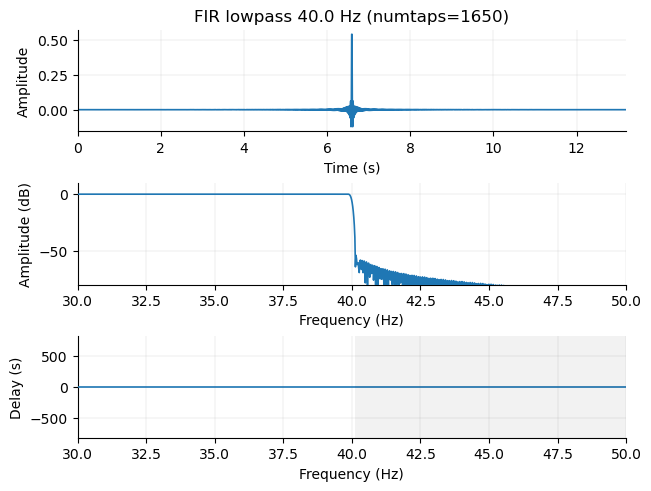

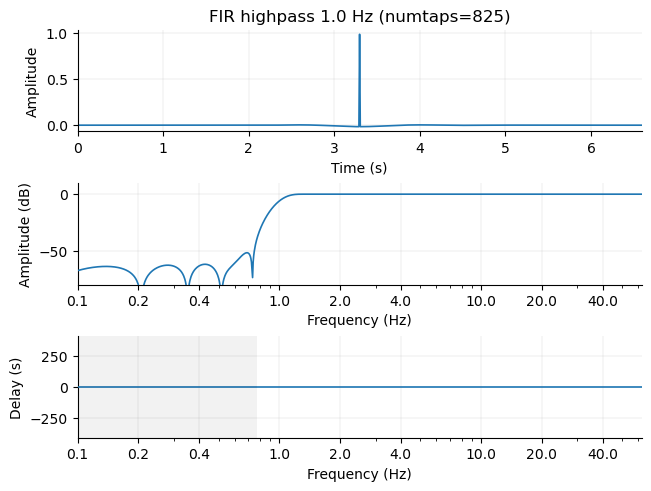

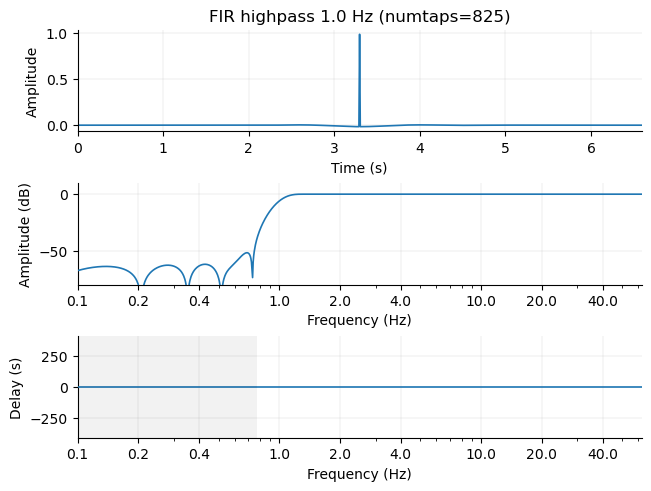

In [ ]:
#lowpass (same style as used in pipeline)
numtaps1 = 1650
cutoff1 = 40.0  

h_low = firwin(numtaps1, cutoff1, fs=125, window='hamming', pass_zero='lowpass')

#plot frequency response
mne.viz.plot_filter(h_low, sfreq=125, title=f'FIR lowpass {cutoff1} Hz (numtaps={numtaps1})', flim = (30, 50), fscale = 'linear')

#highpass maching the pipeline
numtaps = 825 
cutoff = 1.0

h_high = firwin(numtaps, cutoff, fs=125, window='hamming', pass_zero='highpass')

mne.viz.plot_filter(h_high, sfreq=125, title=f'FIR highpass {cutoff} Hz (numtaps={numtaps})')

## 5. Remove Break Periods (Pipeline)

In [ ]:
#remove breaks and extract blocks for all participants
for participant_id, data_dict in processed_data.items():
    print(f"\n[{participant_id}] Removing break periods...")
    
    #load preprocessed raw data
    raw = data_dict['raw_preprocessed']
    annotations = raw.annotations
    
    #find block start and end times based on annotations
    block_times = []
    
    for block_num in range(1, 9):  #exclusion of block 0 (practice block)
        #find start annotations
        start_descriptions = [f'BLOCK_{block_num}_START_SOCIAL', 
                              f'BLOCK_{block_num}_START_NON_SOCIAL']
        
        start_time = None
        for desc in start_descriptions:
            matches = np.where(annotations.description == desc)[0]
            if len(matches) > 0:
                start_time = annotations.onset[matches[0]]
                start_desc = desc
                break
        
        #find end annotations
        end_desc = f'BLOCK_{block_num}_END'
        end_matches = np.where(annotations.description == end_desc)[0]
        
        #match start and end to define block periods
        if start_time is not None and len(end_matches) > 0:
            end_time = annotations.onset[end_matches[0]]
            block_times.append({
                'block': block_num,
                'start': start_time,
                'end': end_time,
                'type': 'SOCIAL' if 'SOCIAL' in start_desc else 'NON_SOCIAL'
            })
    
    print(f"[{participant_id}] Found {len(block_times)} blocks:")
    for block_info in block_times:
        print(f"  Block {block_info['block']} ({block_info['type']}): "
              f"{block_info['start']:.2f}s - {block_info['end']:.2f}s")
    
    if len(block_times) == 0:
        print(f"[{participant_id}] ⚠️ WARNING: No blocks found! Skipping...")
        continue
    
    #crop data to each block
    raw_blocks = []
    for block_info in block_times:
        raw_block = raw.copy().crop(tmin=block_info['start'], tmax=block_info['end'])
        raw_blocks.append(raw_block)
    
    #concatenate all blocks
    raw_clean = mne.concatenate_raws(raw_blocks)
    
    print(f"[{participant_id}] Original: {raw.times[-1]:.2f}s → Cleaned: {raw_clean.times[-1]:.2f}s "
          f"(removed {raw.times[-1] - raw_clean.times[-1]:.2f}s of breaks)")
    
    #save cleaned data
    output_file = f'data_cleaned_{participant_id}_blocks_only.fif'
    raw_clean.save(output_file, overwrite=True)
    
    #store in dict
    processed_data[participant_id]['raw_clean'] = raw_clean
    processed_data[participant_id]['block_info'] = block_times  # Also save block info
    
    print(f"[{participant_id}] ✓ Saved {output_file}")

print(f"\n{'='*60}")
print(f"Block extraction complete for all participants")
print(f"{'='*60}")

#summary of n participants successfully processed
n_processed = sum(1 for d in processed_data.values() if 'raw_clean' in d)
print(f"\nSuccessfully processed {n_processed}/{len(processed_data)} participants")


[P321] Removing break periods...
[P321] Found 5 blocks:
  Block 1 (SOCIAL): 324.05s - 544.15s
  Block 2 (SOCIAL): 555.14s - 769.51s
  Block 3 (SOCIAL): 789.44s - 1006.04s
  Block 4 (SOCIAL): 1027.69s - 1243.36s
  Block 5 (SOCIAL): 1264.71s - 1477.09s
[P321] Original: 1573.35s → Cleaned: 1079.14s (removed 494.21s of breaks)
Overwriting existing file.
Writing /work/BSc_Project/data_cleaned_P321_blocks_only.fif
Overwriting existing file.
Closing /work/BSc_Project/data_cleaned_P321_blocks_only.fif
[done]
[P321] ✓ Saved data_cleaned_P321_blocks_only.fif

[P144] Removing break periods...
[P144] Found 8 blocks:
  Block 1 (SOCIAL): 347.27s - 561.57s
  Block 2 (SOCIAL): 567.79s - 777.76s
  Block 3 (SOCIAL): 786.33s - 987.49s
  Block 4 (SOCIAL): 999.51s - 1199.39s
  Block 5 (SOCIAL): 1208.05s - 1410.41s
  Block 6 (SOCIAL): 1417.60s - 1615.27s
  Block 7 (SOCIAL): 1623.59s - 1825.84s
  Block 8 (SOCIAL): 1834.82s - 2032.64s


/tmp/ipykernel_794/2143609080.py:62: RuntimeWarning: This filename (/work/BSc_Project/data_cleaned_P321_blocks_only.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_clean.save(output_file, overwrite=True)


[P144] Original: 2051.83s → Cleaned: 1625.46s (removed 426.37s of breaks)
Overwriting existing file.
Writing /work/BSc_Project/data_cleaned_P144_blocks_only.fif
Overwriting existing file.
Closing /work/BSc_Project/data_cleaned_P144_blocks_only.fif
[done]
[P144] ✓ Saved data_cleaned_P144_blocks_only.fif

[P295] Removing break periods...
[P295] Found 8 blocks:
  Block 1 (SOCIAL): 262.82s - 481.44s
  Block 2 (SOCIAL): 501.01s - 716.54s
  Block 3 (SOCIAL): 731.65s - 946.02s
  Block 4 (SOCIAL): 984.22s - 1205.44s
  Block 5 (SOCIAL): 1250.13s - 1457.37s
  Block 6 (SOCIAL): 1482.06s - 1694.47s
  Block 7 (SOCIAL): 1707.06s - 1919.52s
  Block 8 (SOCIAL): 1936.22s - 2149.37s


/tmp/ipykernel_794/2143609080.py:62: RuntimeWarning: This filename (/work/BSc_Project/data_cleaned_P144_blocks_only.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_clean.save(output_file, overwrite=True)


[P295] Original: 2183.19s → Cleaned: 1715.03s (removed 468.16s of breaks)
Overwriting existing file.
Writing /work/BSc_Project/data_cleaned_P295_blocks_only.fif
Overwriting existing file.
Closing /work/BSc_Project/data_cleaned_P295_blocks_only.fif
[done]
[P295] ✓ Saved data_cleaned_P295_blocks_only.fif

[P657] Removing break periods...
[P657] Found 8 blocks:
  Block 1 (SOCIAL): 485.76s - 694.72s
  Block 2 (SOCIAL): 703.40s - 905.00s
  Block 3 (SOCIAL): 913.60s - 1115.90s
  Block 4 (SOCIAL): 1123.80s - 1328.95s
  Block 5 (SOCIAL): 1348.72s - 1551.47s
  Block 6 (SOCIAL): 1576.58s - 1778.05s
  Block 7 (SOCIAL): 1785.53s - 1983.19s
  Block 8 (SOCIAL): 2013.66s - 2210.12s


/tmp/ipykernel_794/2143609080.py:62: RuntimeWarning: This filename (/work/BSc_Project/data_cleaned_P295_blocks_only.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_clean.save(output_file, overwrite=True)


[P657] Original: 2243.51s → Cleaned: 1616.41s (removed 627.10s of breaks)
Overwriting existing file.
Writing /work/BSc_Project/data_cleaned_P657_blocks_only.fif
Overwriting existing file.
Closing /work/BSc_Project/data_cleaned_P657_blocks_only.fif
[done]
[P657] ✓ Saved data_cleaned_P657_blocks_only.fif

Block extraction complete for all participants

Successfully processed 4/4 participants


/tmp/ipykernel_794/2143609080.py:62: RuntimeWarning: This filename (/work/BSc_Project/data_cleaned_P657_blocks_only.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw_clean.save(output_file, overwrite=True)


## 6. Epoching and Artifact Rejection 

### Artificial epoching for ICA

In [ ]:
#epoch data for all participants
for participant_id, data in processed_data.items():
    if 'raw_clean' not in data:
        print(f"[{participant_id}] Skipping - no cleaned data")
        continue
    
    print(f"\n[{participant_id}] Creating epochs...")
    
    raw_fit = data['raw_clean'].copy()
    
    #artificial 1-second epochs
    epochs = mne.make_fixed_length_epochs(raw_fit, duration=1, preload=True)
    epoch_data = epochs.get_data(picks='eeg')
    n_epochs, n_channels, n_times = epoch_data.shape
    
    print(f"[{participant_id}] Created {n_epochs} epochs ({n_channels} channels)")

    #storing the epochs
    processed_data[participant_id]['epochs'] = epochs

print(f"\n{'='*60}")
print(f"Epoching complete for all participants")
print(f"{'='*60}")


[P321] Creating epochs...
Not setting metadata
1079 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1079 events and 125 original time points ...
4 bad epochs dropped
[P321] Created 1075 epochs (15 channels)

[P144] Creating epochs...
Not setting metadata
1625 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1625 events and 125 original time points ...
7 bad epochs dropped
[P144] Created 1618 epochs (15 channels)

[P295] Creating epochs...
Not setting metadata
1715 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1715 events and 125 original time points ...
7 bad epochs dropped
[P295] Created 1708 epochs (10 channels)

[P657] Creating epochs...
Not setting metadata
1616 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 161

### Joint Probability Artifact Rejection

In [ ]:
def reject_epochs_joint_probability(epochs, locthresh=3.0, globthresh=3.0, picks='eeg', verbose=True):
    """
    Reject epochs using EEGLAB-style joint probability (pop_jointprob equivalent). 
    """
    data = epochs.get_data(picks=picks)  #(n_epochs, n_channels, n_times)
    n_epochs, n_channels, n_times = data.shape

    if verbose:
        print(f"Input: {n_epochs} epochs, {n_channels} channels, {n_times} samples/epoch")
        print(f"Rejection: local={locthresh} SD, global={globthresh} SD, measure=log_var")

    # 1. Compute log(variance) per epoch per channel
    activity = np.var(data, axis=2)  #(n_epochs, n_channels)
    activity = np.log(activity + 1e-12)

    # 2. Local (per-channel) rejection
    local_mean = np.mean(activity, axis=0)  #(n_channels,)
    local_std = np.std(activity, axis=0)
    z_local = (activity - local_mean[None, :]) / (local_std[None, :] + 1e-12)
    local_outliers = np.any(np.abs(z_local) > locthresh, axis=1)  #(n_epochs,)

    # 3. Global (across-channel) rejection
    global_activity = np.max(activity, axis=1)  #(n_epochs,)
    global_mean = np.mean(global_activity)
    global_std = np.std(global_activity)
    z_global = (global_activity - global_mean) / (global_std + 1e-12)
    global_outliers = np.abs(z_global) > globthresh

    # 4. Combine outliers
    bad_epochs_mask = local_outliers | global_outliers
    bad_indices = np.where(bad_epochs_mask)[0]
    n_bad = len(bad_indices)

    if verbose:
        print(f"Local outliers: {np.sum(local_outliers)}, Global outliers: {np.sum(global_outliers)}")
        print(f"Total rejected: {n_bad} / {n_epochs} ({100.0 * n_bad / n_epochs:.1f}%)")

    epochs_clean_prob = epochs.copy()
    epochs_clean_prob.drop(bad_indices, reason='JOINT_PROB', verbose=False)

    if verbose:
        print(f"Output: {len(epochs_clean_prob)} epochs remaining.")

    return epochs_clean_prob

#apply rejection to all participants
for participant_id, data in processed_data.items():
    if 'epochs' not in data:
        continue
    
    print(f"\n[{participant_id}] Applying joint probability rejection...")
    epochs_clean_prob = reject_epochs_joint_probability(
        data['epochs'], 
        locthresh=3, 
        globthresh=3, 
        picks='eeg', 
        verbose=True
    )
    
    processed_data[participant_id]['epochs_clean'] = epochs_clean_prob

print(f"\n{'='*60}")
print(f"Joint probability rejection complete for all participants")
print(f"{'='*60}")


[P321] Applying joint probability rejection...
Input: 1075 epochs, 15 channels, 125 samples/epoch
Rejection: local=3 SD, global=3 SD, measure=log_var
Local outliers: 50, Global outliers: 1
Total rejected: 50 / 1075 (4.7%)
Output: 1025 epochs remaining.

[P144] Applying joint probability rejection...
Input: 1618 epochs, 15 channels, 125 samples/epoch
Rejection: local=3 SD, global=3 SD, measure=log_var
Local outliers: 44, Global outliers: 0
Total rejected: 44 / 1618 (2.7%)
Output: 1574 epochs remaining.

[P295] Applying joint probability rejection...
Input: 1708 epochs, 10 channels, 125 samples/epoch
Rejection: local=3 SD, global=3 SD, measure=log_var
Local outliers: 61, Global outliers: 8
Total rejected: 61 / 1708 (3.6%)
Output: 1647 epochs remaining.

[P657] Applying joint probability rejection...
Input: 1609 epochs, 15 channels, 125 samples/epoch
Rejection: local=3 SD, global=3 SD, measure=log_var
Local outliers: 52, Global outliers: 0
Total rejected: 52 / 1609 (3.2%)
Output: 1557 ep

## 7. Independent Component Analysis 
### Fit ICA for All Participants
### Visualisation of ICA Components

In [ ]:
#fit ica for all participants
for participant_id, data in processed_data.items():
    if 'epochs_clean' not in data:
        continue
    
    print(f"\n[{participant_id}] Fitting ICA...")
    
    #ica parameters
    ica = mne.preprocessing.ICA(
        n_components=0.999999, 
        random_state=7, 
        max_iter=800, 
        method="infomax", 
        fit_params=dict(extended=True)
    )
    
    #fit ica on cleaned epochs
    ica.fit(data['epochs_clean'])
    
    #store in dict
    processed_data[participant_id]['ica'] = ica
    
    print(f"[{participant_id}] ✓ ICA fitted with {ica.n_components_} components")

print(f"\n{'='*60}")
print(f"ICA fitting complete for all participants")
print(f"{'='*60}")


[P321] Fitting ICA...
Fitting ICA to data using 15 channels (please be patient, this may take a while)
Selecting by explained variance: 15 components
Computing Extended Infomax ICA
Fitting ICA took 16.8s.
[P321] ✓ ICA fitted with 15 components

[P144] Fitting ICA...
Fitting ICA to data using 15 channels (please be patient, this may take a while)
Selecting by explained variance: 15 components
Computing Extended Infomax ICA
Fitting ICA took 27.2s.
[P144] ✓ ICA fitted with 15 components

[P295] Fitting ICA...
Fitting ICA to data using 10 channels (please be patient, this may take a while)
Selecting by explained variance: 10 components
Computing Extended Infomax ICA
Fitting ICA took 16.1s.
[P295] ✓ ICA fitted with 10 components

[P657] Fitting ICA...
Fitting ICA to data using 15 channels (please be patient, this may take a while)
Selecting by explained variance: 15 components
Computing Extended Infomax ICA
Fitting ICA took 22.1s.
[P657] ✓ ICA fitted with 15 components

ICA fitting complet

### Visualize ICA Components for all participants


[P321] Plotting ICA components...
Not setting metadata
1025 matching events found
No baseline correction applied
0 projection items activated
Using matplotlib as 2D backend.


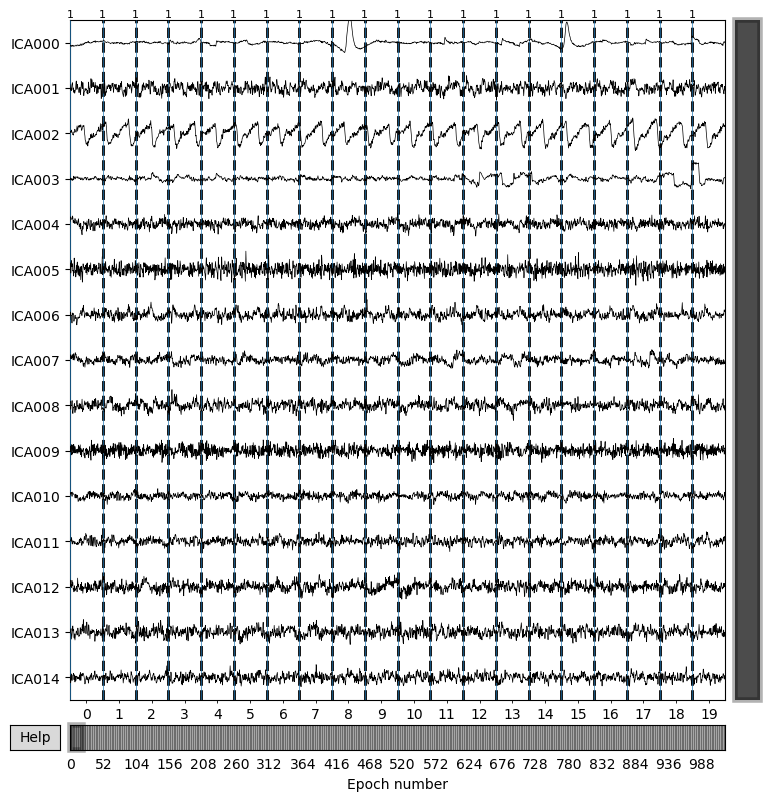

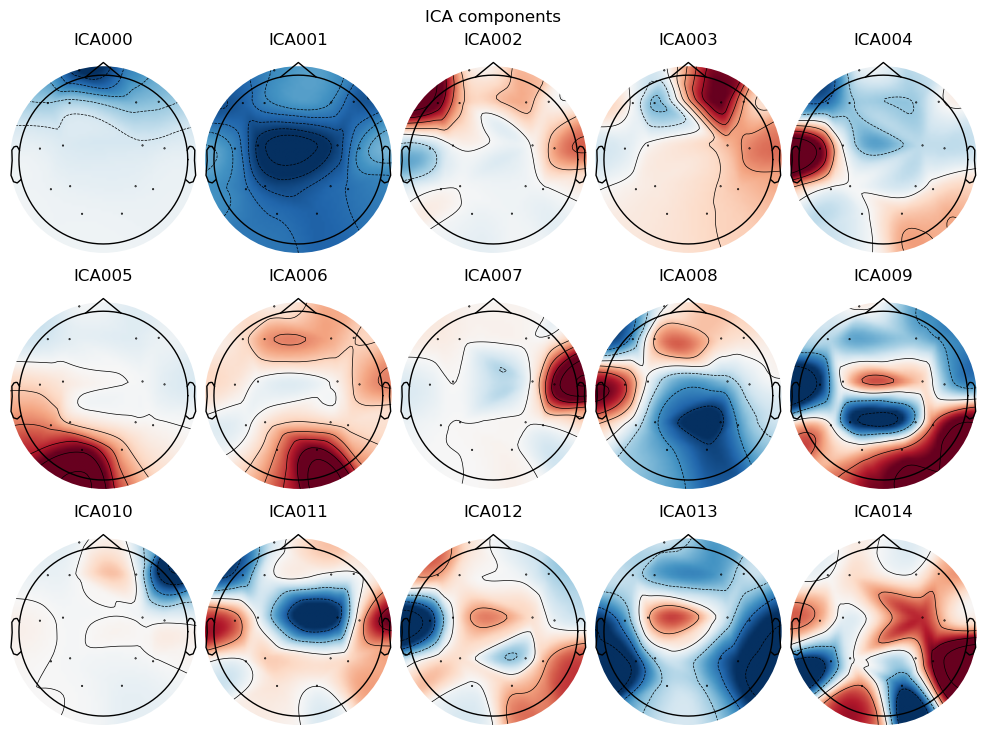

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1025 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1025 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1025 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1025 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1025 matching events found
No baseline correction applied
0 projection items activated


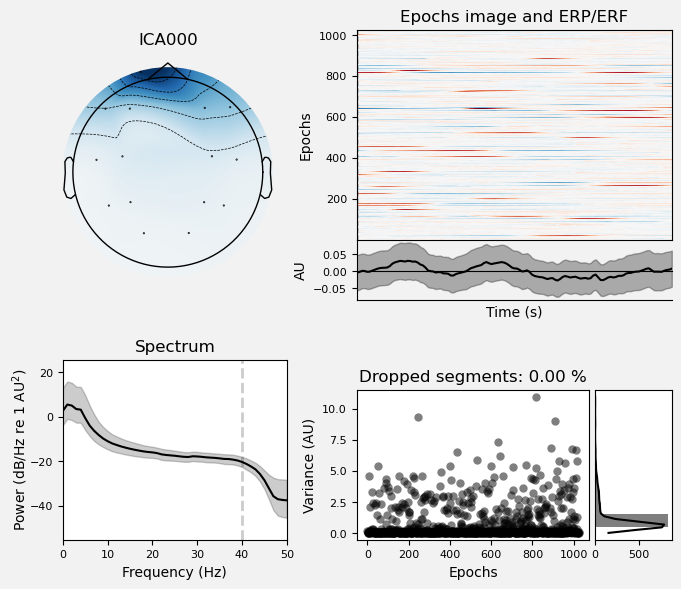

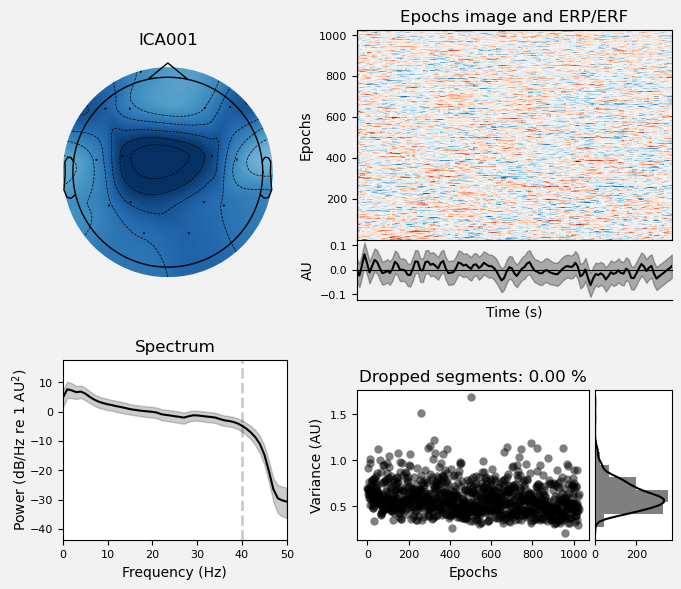

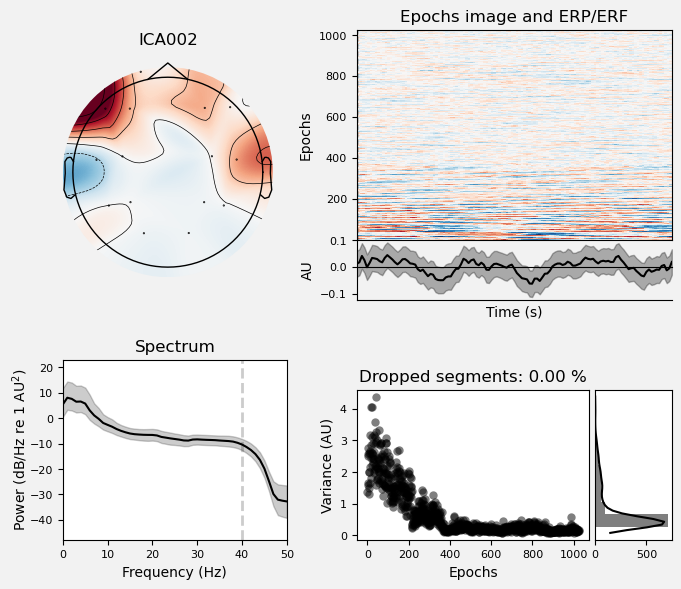

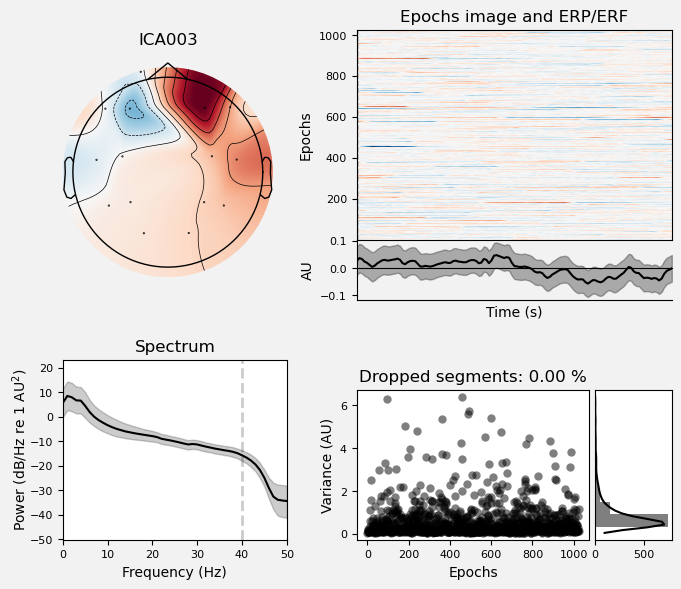

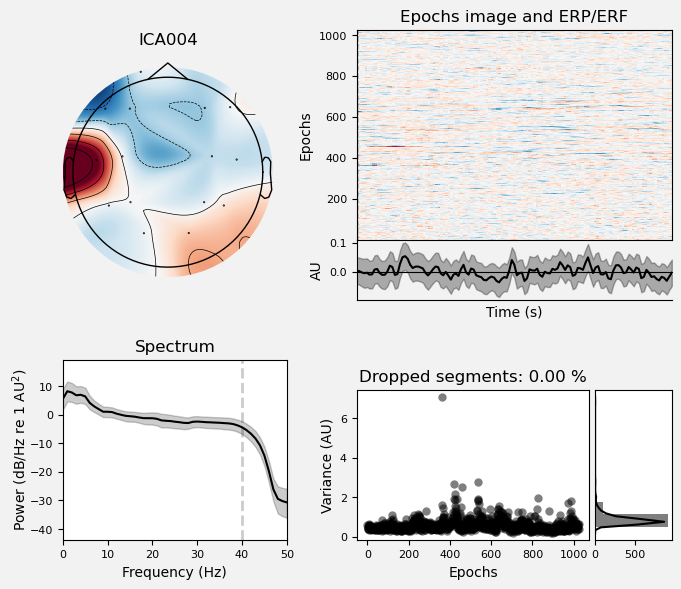


[P144] Plotting ICA components...
Not setting metadata
1574 matching events found
No baseline correction applied
0 projection items activated


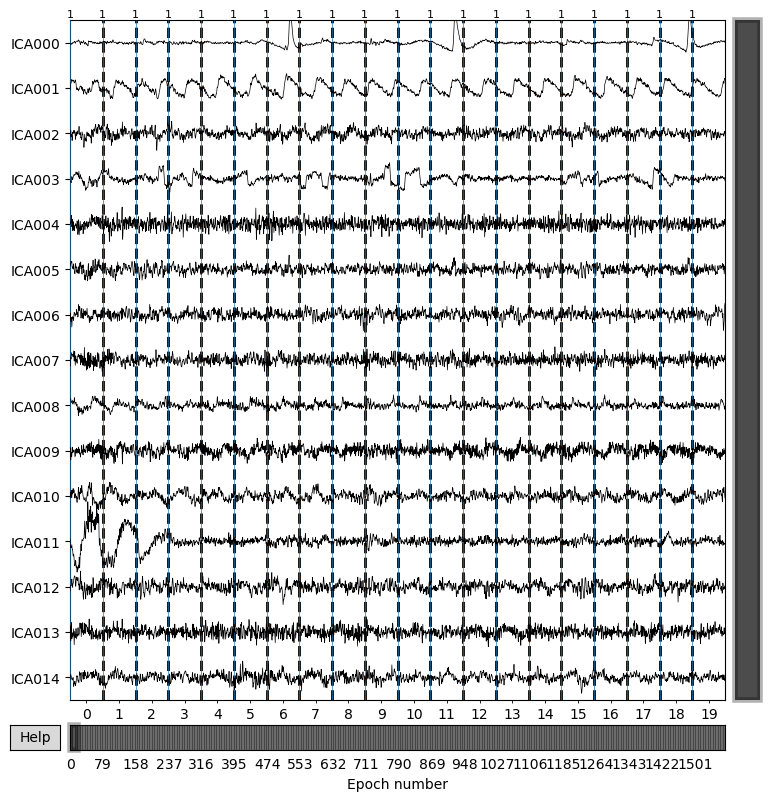

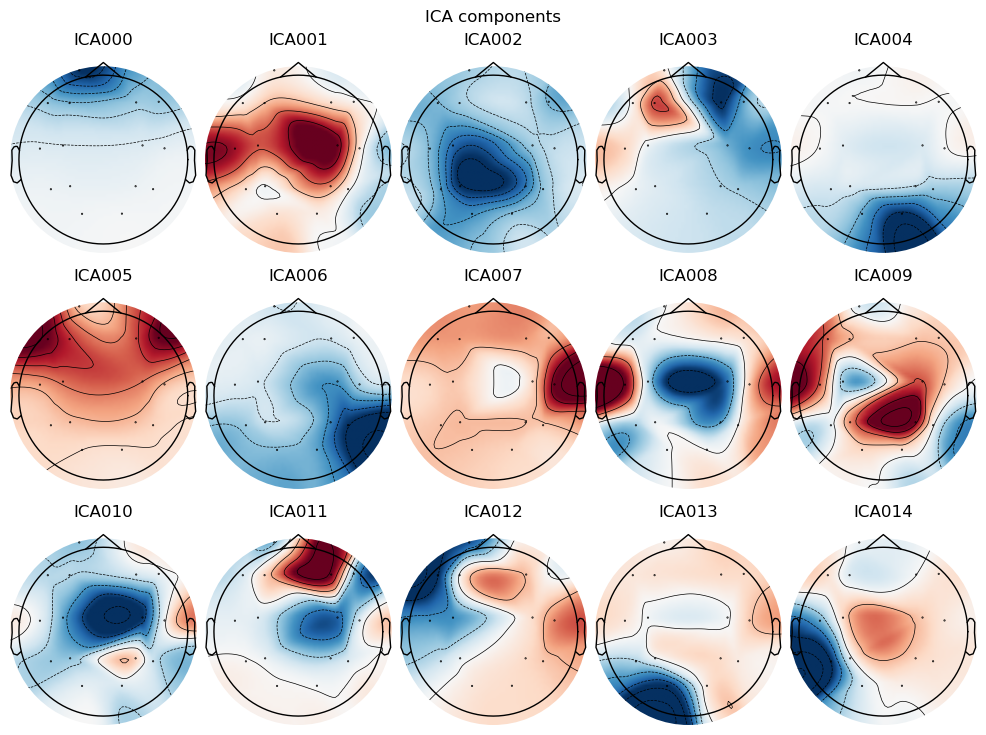

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1574 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1574 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1574 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1574 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1574 matching events found
No baseline correction applied
0 projection items activated


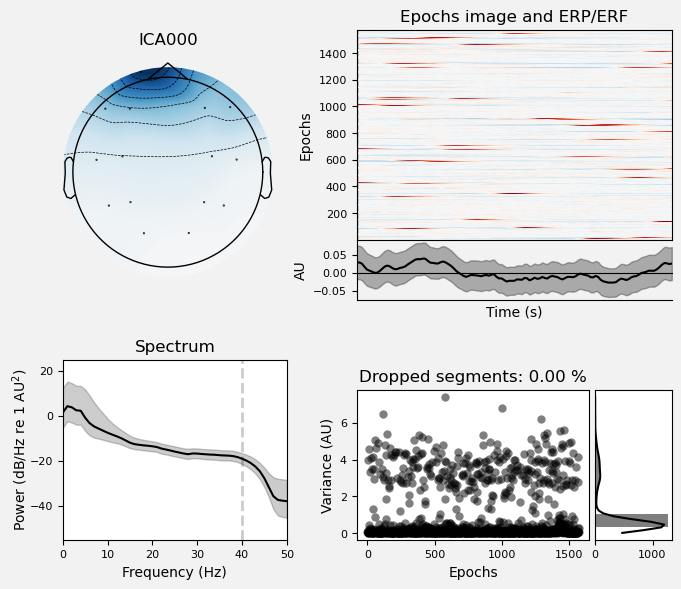

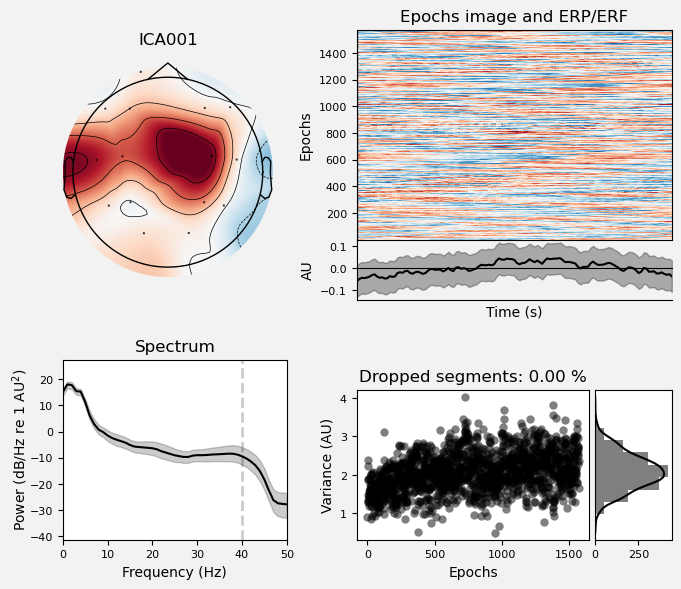

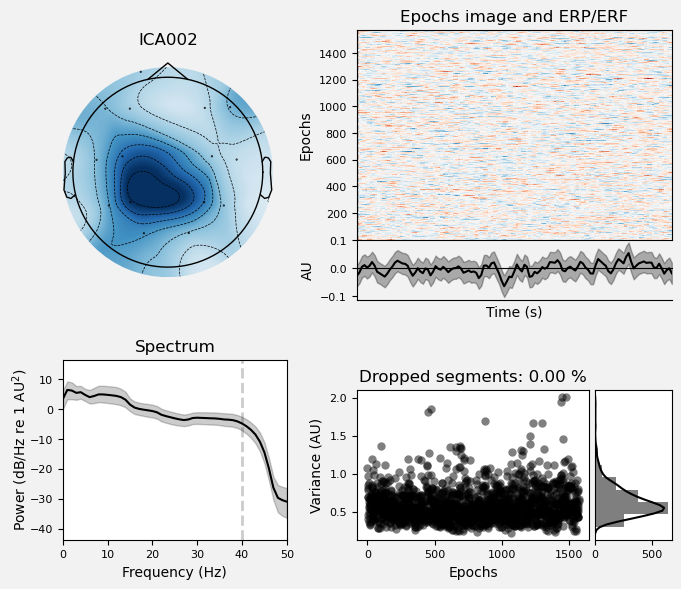

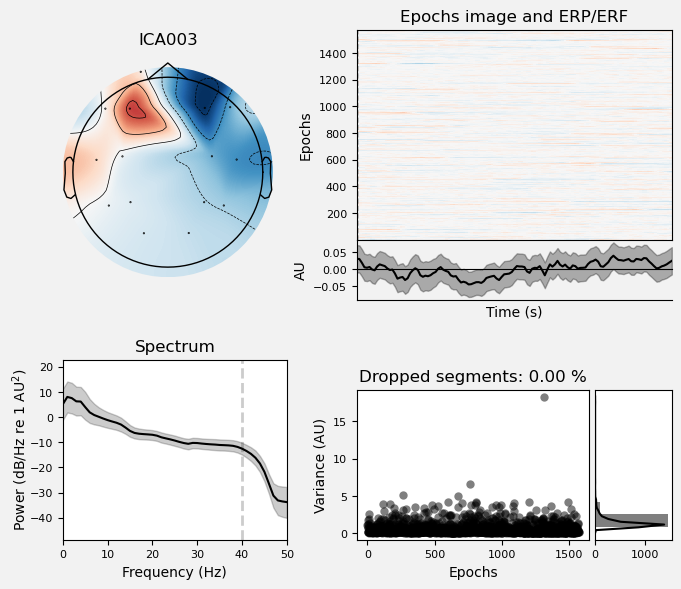

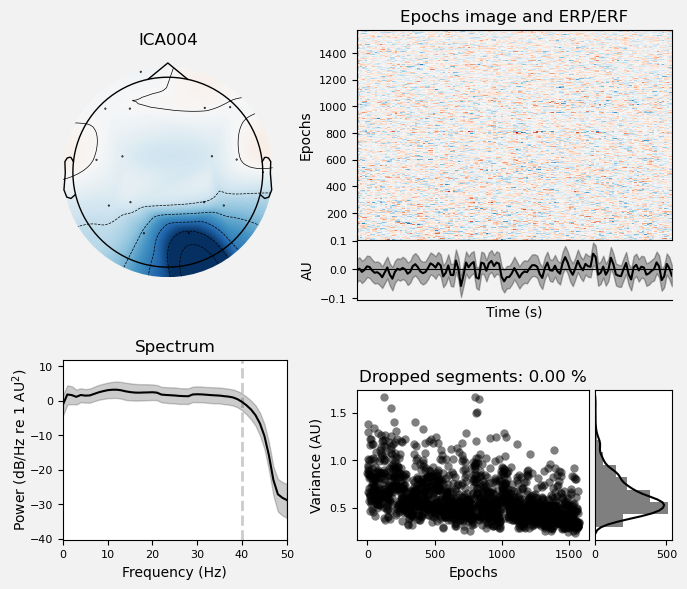


[P295] Plotting ICA components...
Not setting metadata
1647 matching events found
No baseline correction applied
0 projection items activated


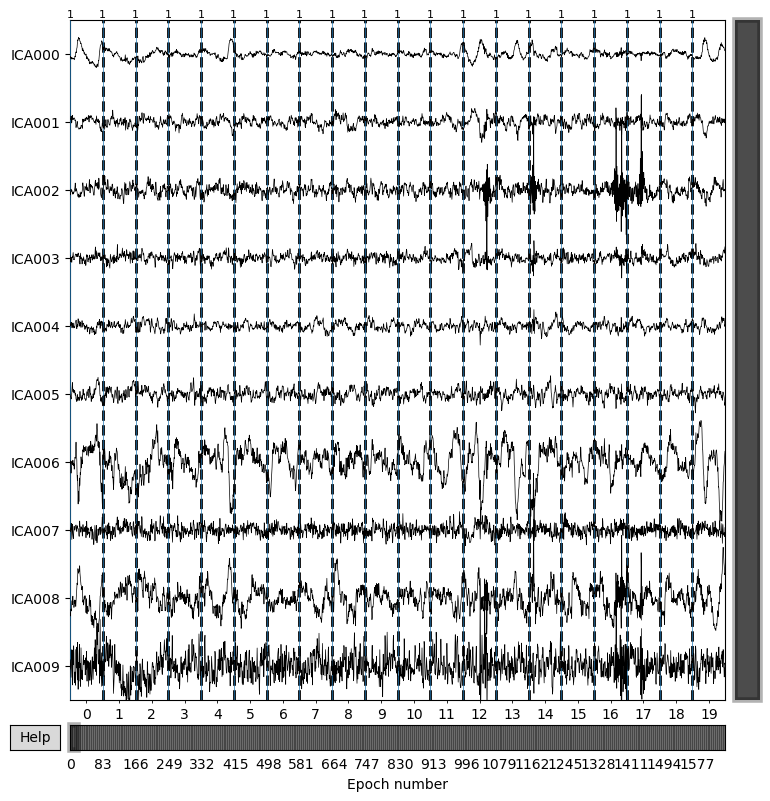

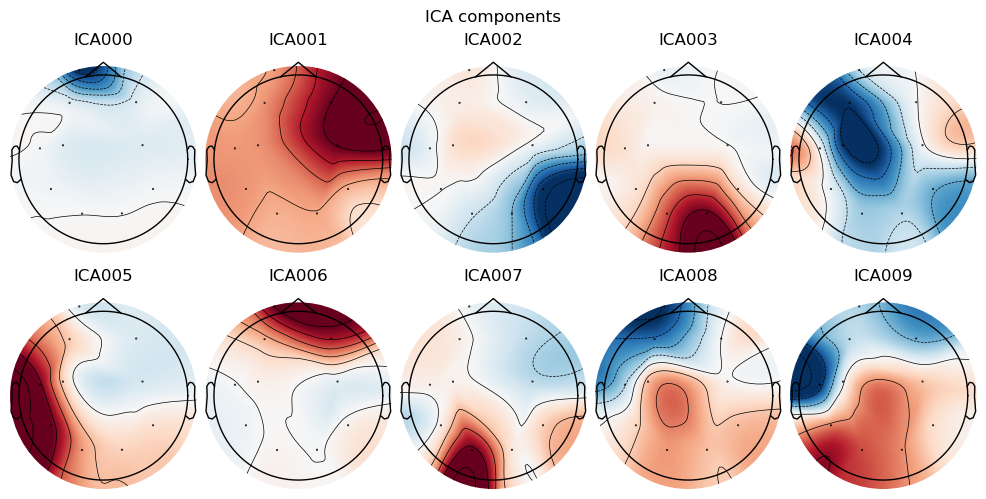

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1647 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1647 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1647 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1647 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1647 matching events found
No baseline correction applied
0 projection items activated


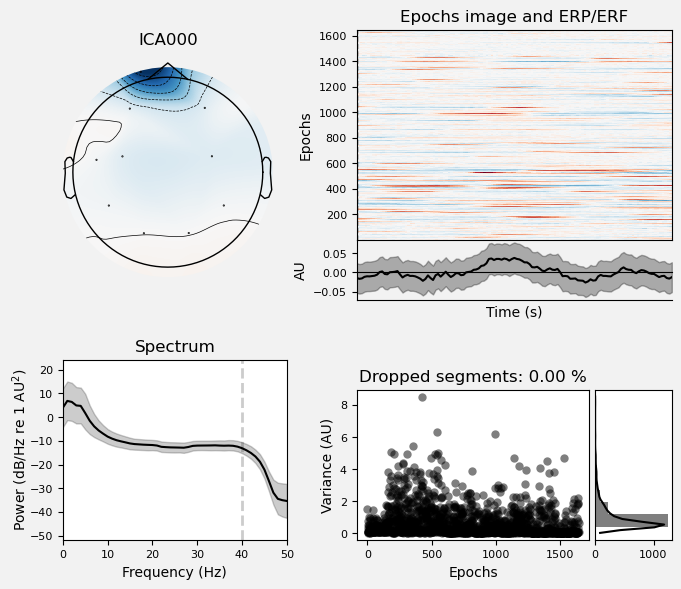

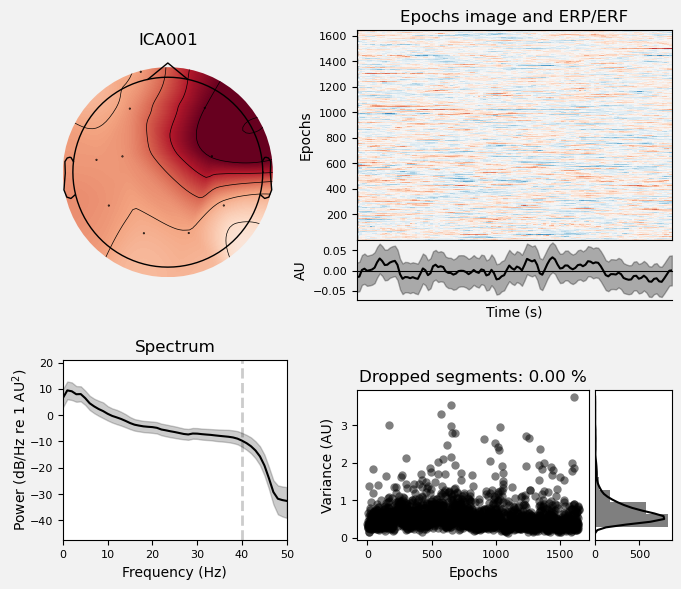

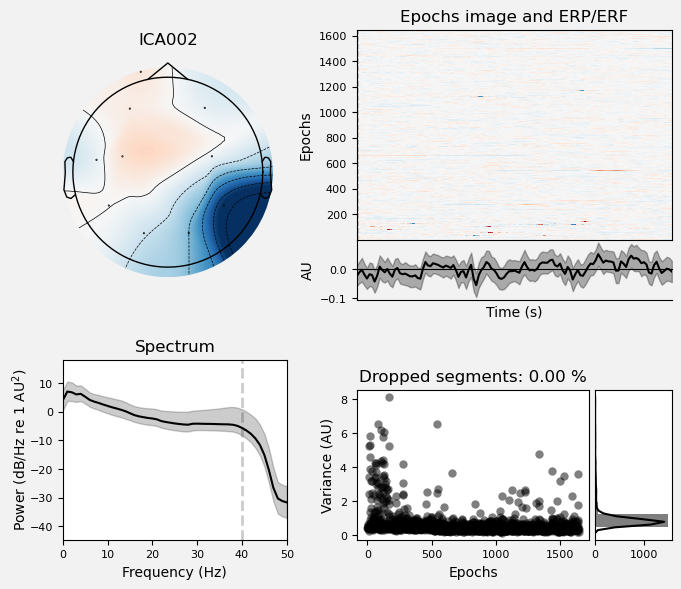

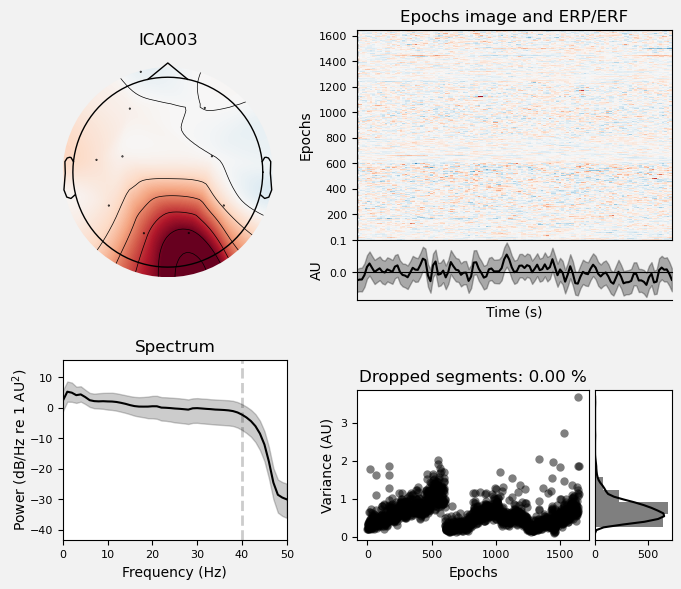

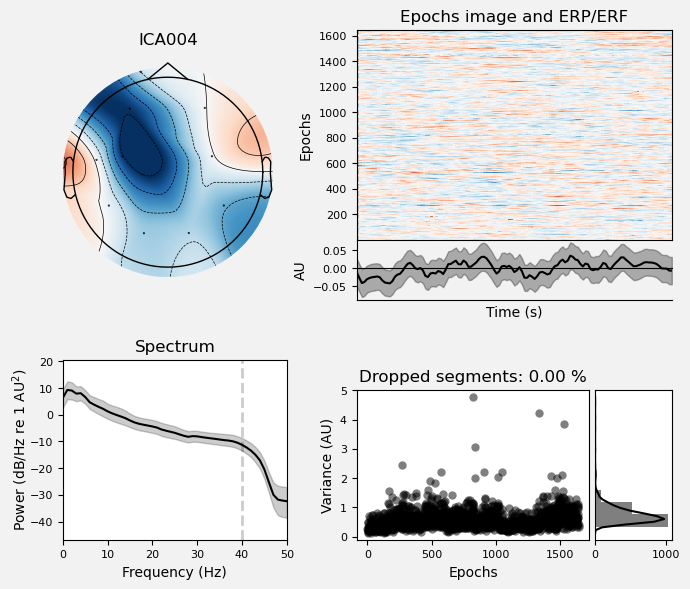


[P657] Plotting ICA components...
Not setting metadata
1557 matching events found
No baseline correction applied
0 projection items activated


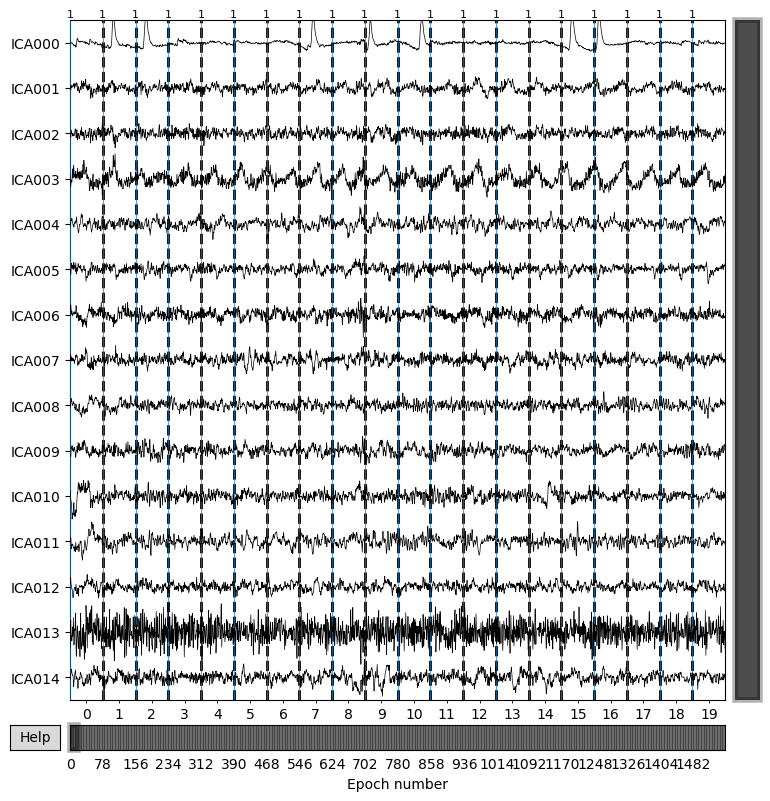

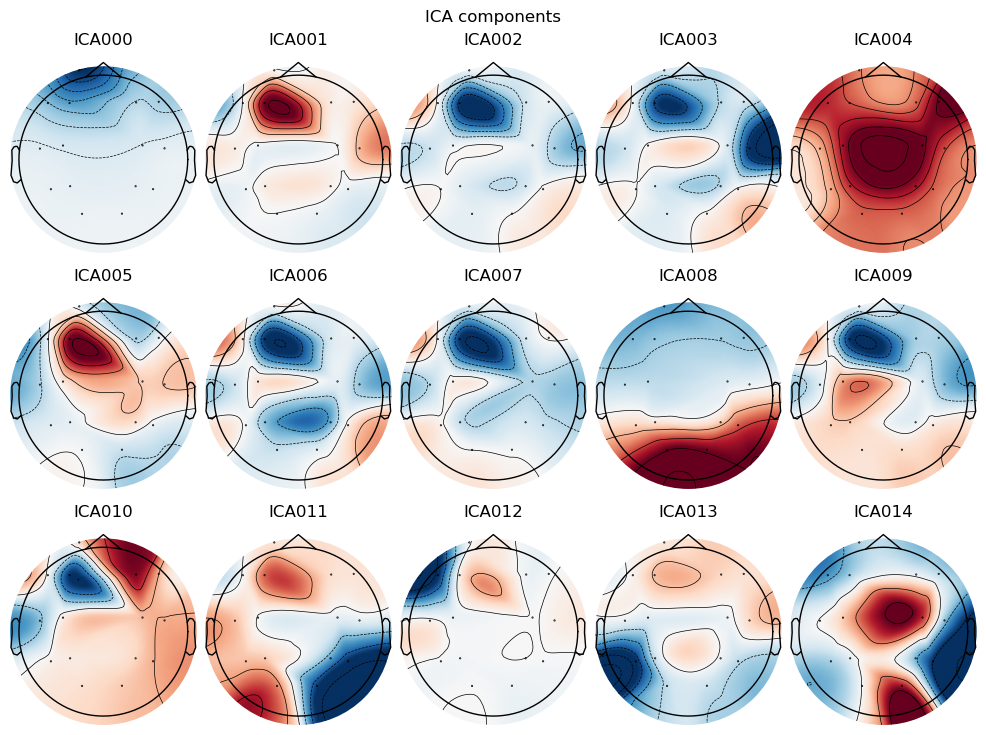

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1557 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1557 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1557 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1557 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1557 matching events found
No baseline correction applied
0 projection items activated


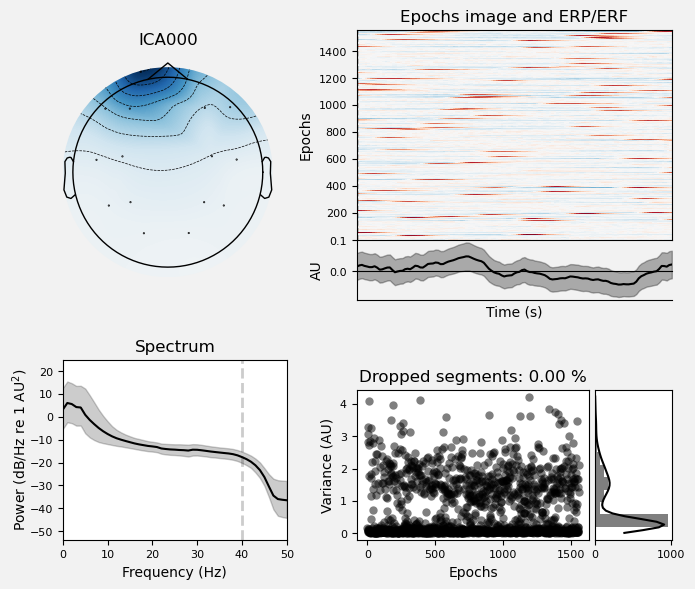

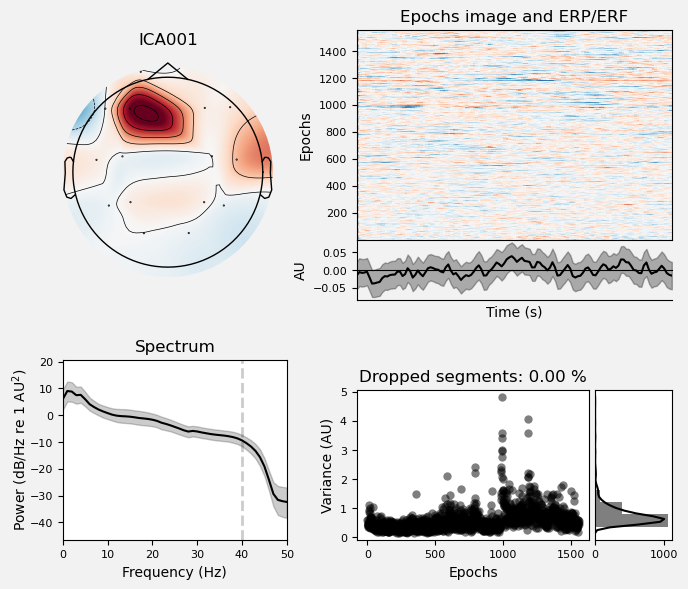

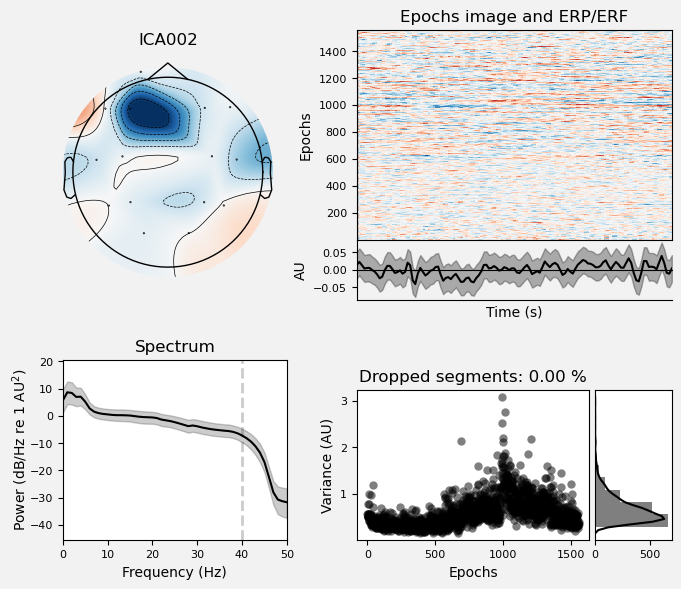

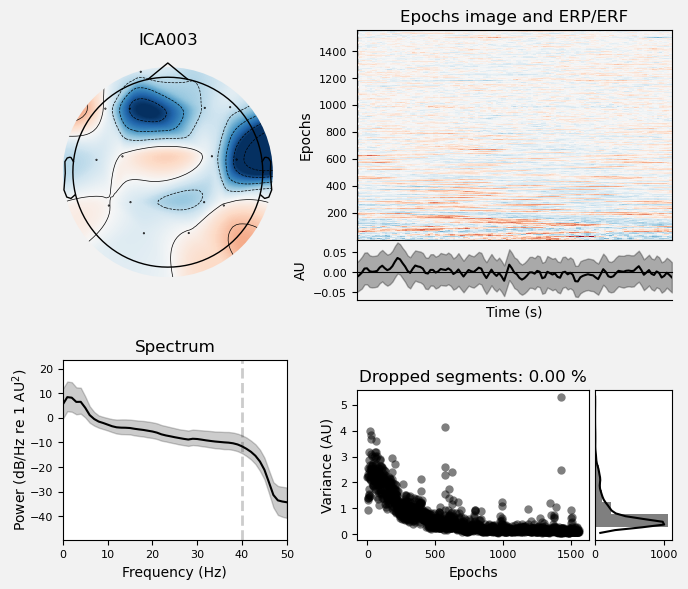

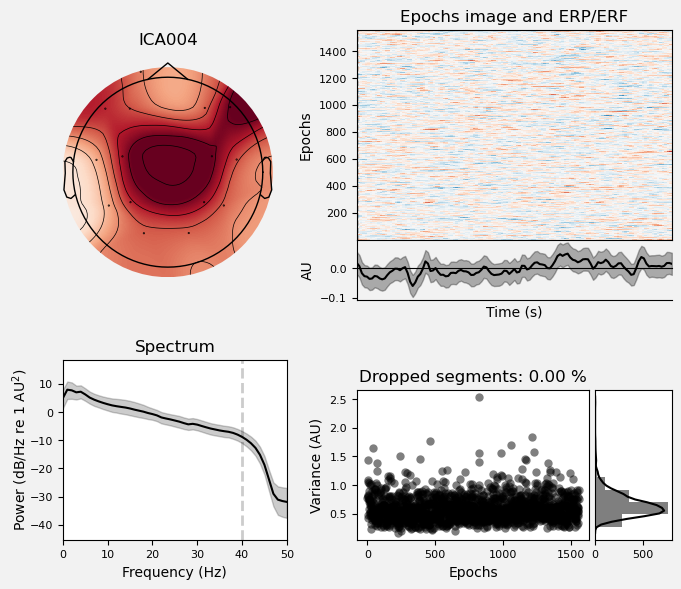

In [ ]:
#ica visualisation for all participants
for participant_id, data in processed_data.items():
    
    if 'epochs_clean' not in data:
        print(f"[{participant_id}] Skipping - no clean epochs")
        continue
    
    if 'ica' not in data:
        print(f"[{participant_id}] Skipping - no ICA fitted")
        continue
    
    print(f"\n[{participant_id}] Plotting ICA components...")
    
    ica = data['ica']
    epochs = data['epochs_clean']
    
    #time courses of components
    ica.plot_sources(epochs)
    
    #topographies
    ica.plot_components(inst=epochs) 

    #properties of components
    ica.plot_properties(epochs)


### Removal of ICA components

In [ ]:
#manual selection of ica components
def apply_manual_ica_selection(processed_data, ica_exclude_dict, plot_properties=False, 
                                apply_ica=True):
    """
    Apply hand-picked ICA component exclusions to all participants based on a dictionary.
   """
    
    print(f"\n{'='*60}")
    print(f"MANUAL ICA COMPONENT SELECTION")
    print(f"{'='*60}")
    print(f"Participants to process: {len(ica_exclude_dict)}")
    print(f"Plot properties: {plot_properties}")
    print(f"Apply ICA: {apply_ica}")
    print(f"{'='*60}\n")
    
    for participant_id, exclude_components in ica_exclude_dict.items():
        
        #chek if participant exists in processed data
        if participant_id not in processed_data:
            print(f"[{participant_id}] ⚠️  WARNING: Participant not found in processed_data - skipping")
            continue
        
        data = processed_data[participant_id]
        
        #chech for ica
        if 'ica' not in data:
            print(f"[{participant_id}] ⚠️  WARNING: No ICA fitted - skipping")
            continue
        
        ica = data['ica']
        
        #chech if exclude_components is in a valid format
        invalid_components = [c for c in exclude_components if c >= ica.n_components_]
        if invalid_components:
            print(f"[{participant_id}] ⚠️  WARNING: Invalid component indices {invalid_components} "
                  f"(max: {ica.n_components_ - 1}) - will be ignored")
            exclude_components = [c for c in exclude_components if c < ica.n_components_]
        
        print(f"\n[{participant_id}] Setting excluded components: {exclude_components}")
        
        #exclude components 
        ica.exclude = exclude_components
        
        #store excluded components in dict
        processed_data[participant_id]['excluded_components'] = exclude_components
        
        #summary of exclusions
        if exclude_components:
            print(f"[{participant_id}] Number of components excluded: {len(exclude_components)}")
        else:
            print(f"[{participant_id}] No components excluded")
        
        #plot properties of excluded components if specified
        if exclude_components and plot_properties:
            print(f"[{participant_id}] Plotting properties of excluded components...")
            
            #check if epochs are available for plotting
            epochs = data.get('epochs_clean')
            if epochs is not None:
                try:
                    ica.plot_properties(epochs, picks=exclude_components, psd_args={'fmax': 50})
                except Exception as e:
                    print(f"[{participant_id}] ⚠️  Error plotting properties: {e}")
            else:
                print(f"[{participant_id}] ⚠️  No epochs available for plotting")
        
        #apply ica to raw data if specified
        if apply_ica:
            preprocessed_raw = data.get('raw_clean')
            
            if preprocessed_raw is None:
                print(f"[{participant_id}] ⚠️  WARNING: No preprocessed raw data found - cannot apply ICA")
                continue
            
            print(f"[{participant_id}] Applying ICA...")
            
            #remove ica components from raw data
            preprocessed_raw_ica = ica.apply(preprocessed_raw.copy())
            
            #store cleaned data in dict
            processed_data[participant_id]['preprocessed_raw_ica'] = preprocessed_raw_ica
            
            print(f"[{participant_id}] ✓ ICA applied - {len(exclude_components)} components removed")
    
    print(f"\n{'='*60}")
    print(f"Manual ICA component selection complete")
    print(f"{'='*60}")
    
    return processed_data


MANUAL ICA COMPONENT SELECTION
Participants to process: 4
Plot properties: True
Apply ICA: True


[P321] Setting excluded components: [0, 3]
[P321] Number of components excluded: 2
[P321] Plotting properties of excluded components...
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1025 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1025 matching events found
No baseline correction applied
0 projection items activated


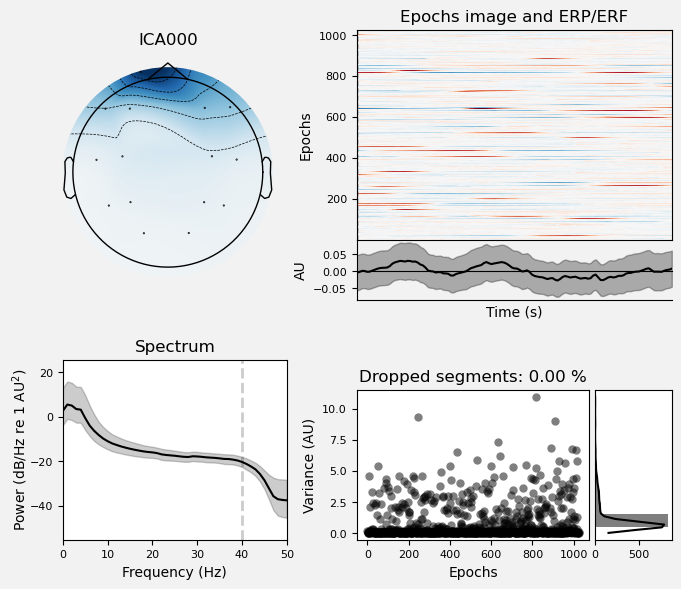

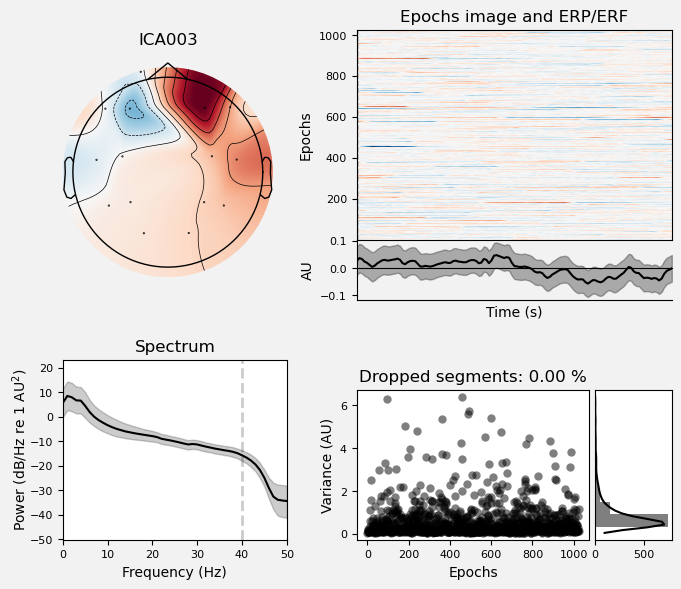

[P321] Applying ICA...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 15 PCA components
[P321] ✓ ICA applied - 2 components removed

[P144] Setting excluded components: [0, 3]
[P144] Number of components excluded: 2
[P144] Plotting properties of excluded components...
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1574 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1574 matching events found
No baseline correction applied
0 projection items activated


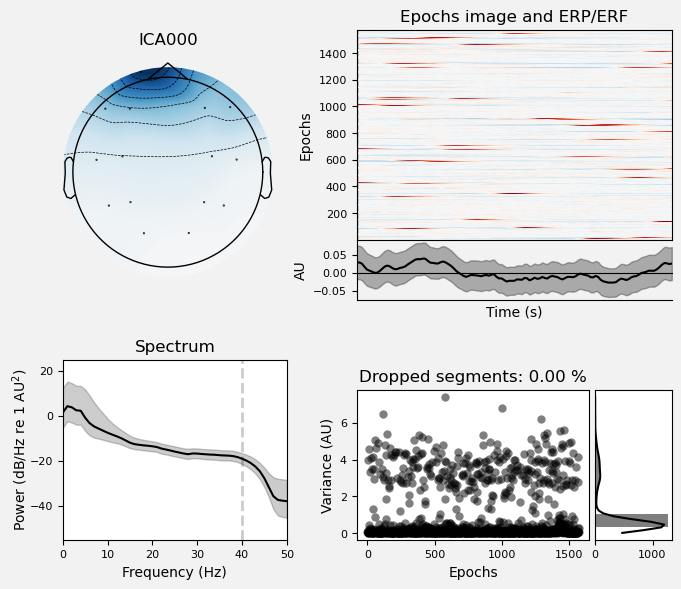

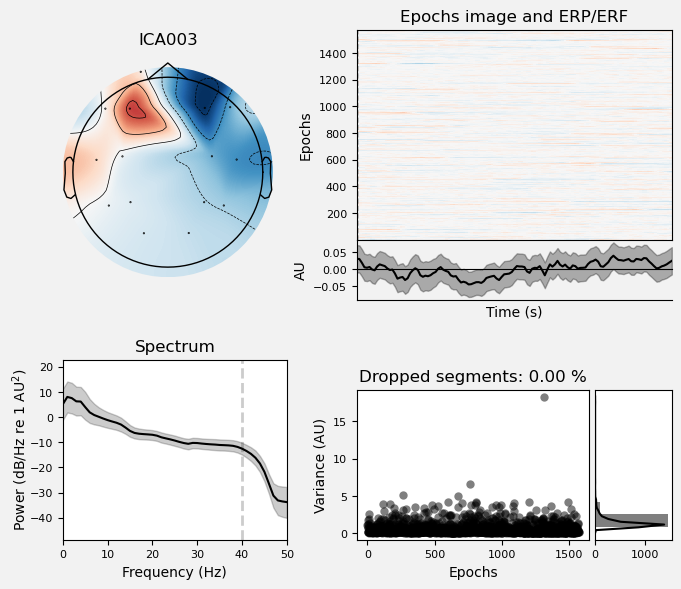

[P144] Applying ICA...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 2 ICA components
    Projecting back using 15 PCA components
[P144] ✓ ICA applied - 2 components removed

[P295] Setting excluded components: [0]
[P295] Number of components excluded: 1
[P295] Plotting properties of excluded components...
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1647 matching events found
No baseline correction applied
0 projection items activated


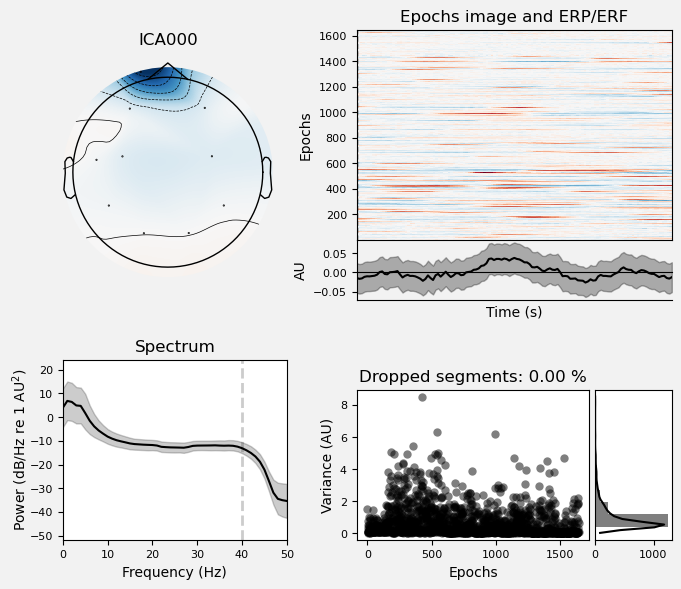

[P295] Applying ICA...
Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 1 ICA component
    Projecting back using 10 PCA components
[P295] ✓ ICA applied - 1 components removed

[P657] Setting excluded components: [0]
[P657] Number of components excluded: 1
[P657] Plotting properties of excluded components...
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1557 matching events found
No baseline correction applied
0 projection items activated


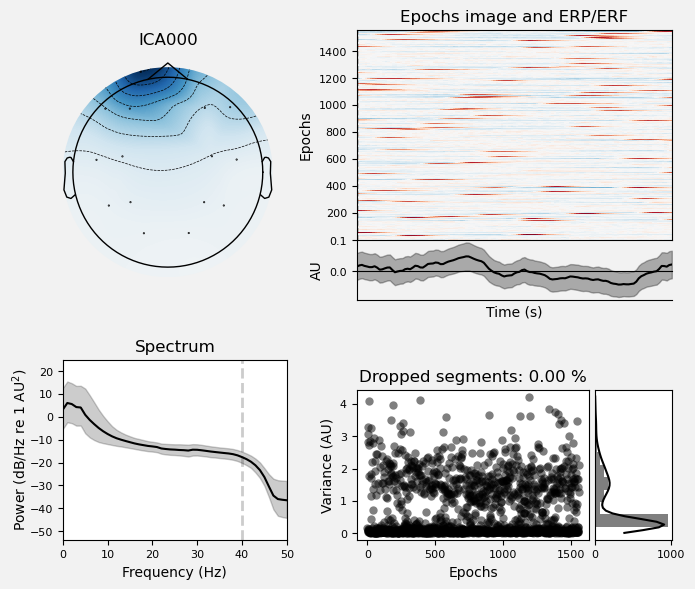

[P657] Applying ICA...
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 1 ICA component
    Projecting back using 15 PCA components
[P657] ✓ ICA applied - 1 components removed

Manual ICA component selection complete


In [ ]:
#hand-picked components to exclude for each participant

#excluding only eye components (bad to exclude components that we dont know what are)
ica_exclude = {
        'P321': [0, 3],
        'P144': [0, 3],
        'P295': [0],
        'P657': [0],
    }
    
#apply selection to the data
processed_data = apply_manual_ica_selection(
    processed_data,
    ica_exclude,
    plot_properties=True,
    apply_ica=True)

In [ ]:
#summary of exclusions for all participants
print(f"\n{'='*60}")
print(f"ICA CLEANING SUMMARY")
print(f"{'='*60}\n")

summary_data = []
for participant_id, data in processed_data.items():
    if 'excluded_components' in data:
        n_excluded = len(data['excluded_components'])
        var_removed = data. get('total_variance_removed', 0)
        summary_data.append({
            'Participant': participant_id,
            'Components Excluded': n_excluded,
            'Variance Removed (%)': f"{var_removed:.2f}"
        })

if summary_data:
    summary_df = pd.DataFrame(summary_data)
    print(summary_df.to_string(index=False))
    
    print(f"\nAverage components excluded: {summary_df['Components Excluded'].mean():.2f}")
    print(f"Total participants processed: {len(summary_df)}")
else:
    print("No participants were processed")

### Component Variance Analysis

In [ ]:
ica_summary_data = []


for participant_id, data in processed_data.items():
    #check if excluded_components is in data
    if 'excluded_components' in data:
        n_excluded = len(data['excluded_components'])
        var_removed = data.get('total_variance_removed', 0)
        
        #extract ica object and epochs for variance explained calculation
        ica_obj = data.get('ica_object')
        epochs_ref = data.get('epochs_for_ica') #epoch used for ica fit
        
        total_var_explained = 0
        if ica_obj is not None and epochs_ref is not None:
            explained_var_ratio = ica_obj.get_explained_variance_ratio(epochs_ref)
            total_var_explained = explained_var_ratio.get('eeg', 0) * 100 #convert to percentage

        ica_summary_data.append({
            'Participant': participant_id,
            'Components Excluded': n_excluded,
            'Total Var Explained (%)': f"{total_var_explained:.2f}",
            'Variance Removed (%)': f"{var_removed:.2f}"
        })

if summary_data:
    summary_df = pd.DataFrame(summary_data)
    #convert column to numeric for summary statistics
    summary_df['Components Excluded'] = pd.to_numeric(summary_df['Components Excluded'])
    
    print(summary_df.to_string(index=False))
    
    print(f"\n--- Summary Statistics ---")
    print(f"Average components excluded: {summary_df['Components Excluded'].mean():.2f}")
    print(f"Total participants processed: {len(summary_df)}")
else:
    print("No participants were processed.")

Participant  Components Excluded Total Var Explained (%) Variance Removed (%)
       P321                    2                    0.00                 0.00
       P144                    2                    0.00                 0.00
       P295                    1                    0.00                 0.00
       P657                    1                    0.00                 0.00

--- Summary Statistics ---
Average components excluded: 1.50
Total participants processed: 4


---

## 8. Summary and Individual Inspection

### Final Quality Check 

### Processing Summary for All Participants

In [ ]:
#processing summary for all participants
print("="*80)
print("PROCESSING SUMMARY")
print("="*80)

for participant_id, data in processed_data.items():
    print(f"\n{participant_id}:")
    print(f"  {'Raw data:':<25} {'✓' if 'raw' in data else '✗'}")
    print(f"  {'Preprocessed:':<25} {'✓' if 'raw_preprocessed' in data else '✗'}")
    print(f"  {'Blocks extracted:':<25} {'✓' if 'raw_clean' in data else '✗'}")
    print(f"  {'Epochs created:':<25} {'✓' if 'epochs' in data else '✗'}")
    
    if 'epochs_clean_prob' in data:
        n_epochs = len(data['epochs_clean_prob'])
        print(f"  {'Clean epochs:':<25} {n_epochs}")
    
    if 'ica' in data:
        n_components = data['ica'].n_components_
        print(f"  {'ICA components:':<25} {n_components}")
        if hasattr(data['ica'], 'exclude'):
            print(f"  {'ICA excluded:':<25} {data['ica'].exclude}")

print("\n" + "="*80)

PROCESSING SUMMARY

P321:
  Raw data:                 ✓
  Preprocessed:             ✓
  Blocks extracted:         ✓
  Epochs created:           ✓
  ICA components:           15
  ICA excluded:             [0, 3]

P144:
  Raw data:                 ✓
  Preprocessed:             ✓
  Blocks extracted:         ✓
  Epochs created:           ✓
  ICA components:           15
  ICA excluded:             [0, 3]

P295:
  Raw data:                 ✓
  Preprocessed:             ✓
  Blocks extracted:         ✓
  Epochs created:           ✓
  ICA components:           10
  ICA excluded:             [0]

P657:
  Raw data:                 ✓
  Preprocessed:             ✓
  Blocks extracted:         ✓
  Epochs created:           ✓
  ICA components:           15
  ICA excluded:             [0]



## 9. Bandpass filtering

### Alpha frequency band (7-13 Hz)

In [ ]:
#alpha frequency bandpass

alpha_low = 7
alpha_high = 13

for participant_id, data in processed_data.items():
    
    #cleaned data without the IBI (inter block intervals) + applied ICA
    raw_clean_ica = data['preprocessed_raw_ica']
    
    #alpha band filter
    print(f"[{participant_id}]   Applying alpha band filter ({alpha_low}-{alpha_high} Hz)...")
    raw_alpha = raw_clean_ica.copy().filter(
        l_freq=alpha_low,
        h_freq=alpha_high,
        picks='eeg',
        filter_length='auto',
        fir_design='firwin',
        fir_window='hamming',
        phase='zero',
        verbose=False
    )
    
    #saving filtered data
    processed_data[participant_id]['raw_alpha'] = raw_alpha
    
    print(f"[{participant_id}] ✓ Complete")
    print(f"[{participant_id}]   Duration: {raw_alpha.times[-1]:.2f}s")

print(f"\n{'='*60}")
print(f"✓ Alpha filtering complete for all participants")
print(f"{'='*60}")

[P321]   Applying alpha band filter (7-13 Hz)...
[P321] ✓ Complete
[P321]   Duration: 1079.14s
[P144]   Applying alpha band filter (7-13 Hz)...
[P144] ✓ Complete
[P144]   Duration: 1625.46s
[P295]   Applying alpha band filter (7-13 Hz)...
[P295] ✓ Complete
[P295]   Duration: 1715.03s
[P657]   Applying alpha band filter (7-13 Hz)...
[P657] ✓ Complete
[P657]   Duration: 1616.41s

✓ Alpha filtering complete for all participants


### Low beta frequency band (13-25Hz)

In [ ]:
#beta frequency bandpass

beta_low = 13
beta_high = 25

for participant_id, data in processed_data.items():
    
    #cleaned data without the IBI (inter block intervals) + applied ICA
    raw_clean_ica = data['preprocessed_raw_ica']
    
    #beta band filter
    print(f"[{participant_id}]   Applying beta band filter ({beta_low}-{beta_high} Hz)...")
    raw_low_beta = raw_clean_ica.copy().filter(
        l_freq=beta_low,
        h_freq=beta_high,
        picks='eeg',
        filter_length='auto',
        fir_design='firwin',
        fir_window='hamming',
        phase='zero',
        verbose=False
    )
    
    #saving filtered data
    processed_data[participant_id]['raw_low_beta'] = raw_low_beta
    
    print(f"[{participant_id}] ✓ Complete")
    print(f"[{participant_id}]   Duration: {raw_low_beta.times[-1]:.2f}s")

print(f"\n{'='*60}")
print(f"✓ Beta filtering complete for all participants")
print(f"{'='*60}")

[P321]   Applying beta band filter (13-25 Hz)...
[P321] ✓ Complete
[P321]   Duration: 1079.14s
[P144]   Applying beta band filter (13-25 Hz)...
[P144] ✓ Complete
[P144]   Duration: 1625.46s
[P295]   Applying beta band filter (13-25 Hz)...
[P295] ✓ Complete
[P295]   Duration: 1715.03s
[P657]   Applying beta band filter (13-25 Hz)...
[P657] ✓ Complete
[P657]   Duration: 1616.41s

✓ Beta filtering complete for all participants


### High beta frequency band (25-30 Hz)

In [ ]:
#beta frequency bandpass

beta_low = 25
beta_high = 30

for participant_id, data in processed_data.items():
    
    #cleaned data without the IBI (inter block intervals) + applied ICA
    raw_clean_ica = data['preprocessed_raw_ica']
    
    #beta band filter
    print(f"[{participant_id}]   Applying beta band filter ({beta_low}-{beta_high} Hz)...")
    raw_high_beta = raw_clean_ica.copy().filter(
        l_freq=beta_low,
        h_freq=beta_high,
        picks='eeg',
        filter_length='auto',
        fir_design='firwin',
        fir_window='hamming',
        phase='zero',
        verbose=False
    )
    
    #saving filtered data
    processed_data[participant_id]['raw_high_beta'] = raw_high_beta
    
    print(f"[{participant_id}] ✓ Complete")
    print(f"[{participant_id}]   Duration: {raw_high_beta.times[-1]:.2f}s")

print(f"\n{'='*60}")
print(f"✓ Beta filtering complete for all participants")
print(f"{'='*60}")


[P321]   Applying beta band filter (25-30 Hz)...
[P321] ✓ Complete
[P321]   Duration: 1079.14s
[P144]   Applying beta band filter (25-30 Hz)...
[P144] ✓ Complete
[P144]   Duration: 1625.46s
[P295]   Applying beta band filter (25-30 Hz)...
[P295] ✓ Complete
[P295]   Duration: 1715.03s
[P657]   Applying beta band filter (25-30 Hz)...
[P657] ✓ Complete
[P657]   Duration: 1616.41s

✓ Beta filtering complete for all participants


## 10. Hilbert transform

In [ ]:
#hilbert transform and amplitude envelope extraction for all participants
for participant_id, data in processed_data.items():
    
    raw_low_beta = data["raw_low_beta"]
    raw_high_beta = data["raw_high_beta"]
    raw_alpha = data["raw_alpha"]
    
    print(f"[{participant_id}] Applying Hilbert transform and extracting amplitude envelope...")
    
    #aply hilbert transform and get complex analytical signal
    hilbert_beta_low = raw_low_beta.copy()
    hilbert_beta_high = raw_high_beta.copy()
    hilbert_alpha = raw_alpha.copy()

    hilbert_beta_low.apply_hilbert(picks="eeg", n_jobs=-1, envelope=False)
    hilbert_beta_high.apply_hilbert(picks="eeg", n_jobs=-1, envelope=False)
    hilbert_alpha.apply_hilbert(picks="eeg", n_jobs=-1, envelope=False)
    
    #extract amplitude envelope from continuous data
    amp_beta_low = np.abs(hilbert_beta_low.get_data(picks='eeg'))
    amp_beta_high = np.abs(hilbert_beta_high.get_data(picks='eeg'))
    amp_alpha = np.abs(hilbert_alpha.get_data(picks='eeg'))
    
    #replace complex data with real amplitude values
    raw_beta_low_amp = hilbert_beta_low.copy()
    raw_beta_high_amp = hilbert_beta_high.copy()
    raw_alpha_amp = hilbert_alpha.copy()
    
    raw_beta_low_amp._data = amp_beta_low
    raw_beta_high_amp._data = amp_beta_high
    raw_alpha_amp._data = amp_alpha
    
    #saving the amplitude data
    processed_data[participant_id]['raw_low_beta_amplitude'] = raw_beta_low_amp
    processed_data[participant_id]['raw_high_beta_amplitude'] = raw_beta_high_amp
    processed_data[participant_id]['raw_alpha_amplitude'] = raw_alpha_amp

    print(f"[{participant_id}] ✓ Hilbert amplitude envelope extracted")
    print(f"[{participant_id}]   Duration: {raw_alpha_amp.times[-1]:.2f}s")

print(f"\n{'='*60}")
print(f"✓ Amplitude envelope extraction complete for all participants")
print(f"{'='*60}")

[P321] Applying Hilbert transform and extracting power envelope...


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:    2.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:    0.1s finished


[P321] ✓ Hilbert amplituder envelope extracted
[P321]   Duration: 1079.14s
[P144] Applying Hilbert transform and extracting power envelope...


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  12 out of  15 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:    0.2s finished


[P144] ✓ Hilbert amplituder envelope extracted
[P144]   Duration: 1625.46s
[P295] Applying Hilbert transform and extracting power envelope...


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.1s finished


[P295] ✓ Hilbert amplituder envelope extracted
[P295]   Duration: 1715.03s
[P657] Applying Hilbert transform and extracting power envelope...


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  12 out of  15 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:    0.2s finished


[P657] ✓ Hilbert amplituder envelope extracted
[P657]   Duration: 1616.41s

✓ Amplitude envelope extraction complete for all participants


## 11. Creating Epochs of Interest

In [ ]:
#find unique cue and move markers for epoching and condiiton definition

raw = processed_data['P144']['raw'] 
annotations = raw.annotations

#find all unique cue_show markers
cue_markers = [desc for desc in annotations.description if 'CUE_SHOW' in desc]
unique_cues = sorted(set(cue_markers))

print(f"Total CUE_SHOW markers: {len(cue_markers)}")
print(f"Unique formats: {len(unique_cues)}\n")

print("Sample markers:")
for marker in unique_cues[:12]:  #show 12 cue formats (all condition combinations)
    print(f"  {marker}")

#find all unique move_start markers
move_markers = [desc for desc in annotations.description if 'MOVE_START' in desc]
unique_moves = sorted(set(move_markers))

print(f"Total MOVE_START markers: {len(move_markers)}")
print(f"Unique formats: {len(unique_moves)}\n")

print("Sample markers:")
for marker in unique_moves[:12]: 
    print(f"  {marker}")



ACTUAL CUE_SHOW MARKER FORMATS FOR P321

Total CUE_SHOW markers: 150
Unique formats: 12

Sample markers:
  CUE_SHOW_010
  CUE_SHOW_011
  CUE_SHOW_020
  CUE_SHOW_021
  CUE_SHOW_050
  CUE_SHOW_051
  CUE_SHOW_110
  CUE_SHOW_111
  CUE_SHOW_120
  CUE_SHOW_121
  CUE_SHOW_150
  CUE_SHOW_151


MOVE_START MARKER FORMATS
------------------------------------------------------------
Total MOVE_START markers: 150
Unique formats: 12

Sample markers:
  MOVE_START_010
  MOVE_START_011
  MOVE_START_020
  MOVE_START_021
  MOVE_START_050
  MOVE_START_051
  MOVE_START_110
  MOVE_START_111
  MOVE_START_120
  MOVE_START_121
  MOVE_START_150
  MOVE_START_151



### Create Event Epochs and Apply Rejection

In [ ]:
#create variable dur epochs (based on cue and move markers)
def create_variable_duration_epochs(raw, event_type='CUE', block_info=None, 
                                     tmin_before=0.5, add_fixation=True):
    """
    Create epochs with variable durations based on START and END markers.
    
    For CUE events: Uses CUE_SHOW as start and MOVE_START as end
    For MOVE events: Uses MOVE_START as start and MOVE_END as end
    """
    
    annotations = raw.annotations
    sfreq = raw.info['sfreq']
    
    #find start and end markers for both event types
    start_markers = []
    end_markers = []
    
    for i, desc in enumerate(annotations.description):
        onset = annotations.onset[i]
        
        #check block info 
        if block_info is not None:
            experimental_blocks = [b for b in block_info if b['block'] != 0]
            in_experimental = any(b['start'] <= onset <= b['end'] for b in experimental_blocks)
            if not in_experimental:
                continue
        
        #identification of markers 
        if event_type == 'CUE':
            #CUE: start = CUE_SHOW, end = MOVE_START
            if 'CUE_SHOW' in desc.upper():
                start_markers.append({'onset': onset, 'desc': desc, 'index': i})
            elif 'MOVE_START' in desc.upper():
                end_markers.append({'onset': onset, 'desc': desc, 'index': i})
        
        elif event_type == 'MOVE':
            #MOVE: start = MOVE_START, end = MOVE_END
            if 'MOVE_START' in desc.upper():
                start_markers.append({'onset': onset, 'desc': desc, 'index': i})
            elif 'MOVE_END' in desc.upper():
                end_markers.append({'onset': onset, 'desc': desc, 'index': i})
    
    print(f"\nFound {len(start_markers)} START and {len(end_markers)} END markers for {event_type}")
    
    #match start with end markers based on condition code and timing
    epochs_list = []
    event_info = []
    matched_count = 0
    
    for start_marker in start_markers:
        start_time = start_marker['onset']
        start_desc = start_marker['desc']
        
        #condition code extraction
        code_match = re.search(r'[_]([A-Z]?\d+)$', start_desc)
        if not code_match:
            continue
        condition_code = code_match.group(1)
        
        #find matching end marker with same condition code and reasonable timing
        end_time = None
        matched_end_desc = None
        
        for end_marker in end_markers:
            end_desc = end_marker['desc']
            end_code_match = re.search(r'[_]([A-Z]?\d+)$', end_desc)
            
            if end_code_match and end_code_match.group(1) == condition_code:
                candidate_end = end_marker['onset']
                
                #check if end marker is after start and within expected duration range
                if candidate_end > start_time:
                    #for CUE: ~ 1-1.5s duration
                    #for MOVE: ~ 0.3-1s duration
                    max_duration = 2.0 if event_type == 'CUE' else 1.0
                    
                    if (candidate_end - start_time) < max_duration:
                        if end_time is None or candidate_end < end_time:
                            end_time = candidate_end
                            matched_end_desc = end_desc
        
        if end_time is None:
            print(f"  Warning: No matching END found for {start_desc}")
            continue
        
        matched_count += 1
        
        #calcualte actual event dur
        event_duration = end_time - start_time
        
        #determine epoch window
        if add_fixation and event_type == 'CUE':
            #include fixation for cue epochs (from -1.2s to event end)
            tmin = -1.2  #fixation: -1.1 to -0.6 s + buffer
        else:
            tmin = -tmin_before
        
        tmax = event_duration + 0.1  #+ small buffer after event end
        
        #create event array for epoching
        event_sample = int(start_time * sfreq)
        events = np.array([[event_sample, 0, 1]])
        event_id = {'event': 1}
        
        #create epoch for this event
        try:
            epoch = mne.Epochs(raw, events, event_id, 
                              tmin=tmin, tmax=tmax,
                              baseline=None, picks='eeg', 
                              preload=True, verbose=False)
            
            if len(epoch) > 0:
                epochs_list.append(epoch)
                event_info.append({
                    'condition_code': condition_code,
                    'start_time': start_time,
                    'end_time': end_time,
                    'duration': event_duration,
                    'tmin': tmin,
                    'tmax': tmax,
                    'epoch_index': len(epochs_list) - 1,
                    'start_marker': start_desc,
                    'end_marker': matched_end_desc
                })
        except Exception as e:
            print(f"  Error creating epoch for {start_desc}: {e}")
            continue
    
    print(f"Successfully matched and created {matched_count} variable-duration epochs")
    
    if len(event_info) > 0:
        durations = [e['duration'] for e in event_info]
        print(f"Duration range: {min(durations):.3f}s - {max(durations):.3f}s (mean: {np.mean(durations):.3f}s)")
    
    return epochs_list, event_info

#reject bad epochs using joint. prob
def reject_variable_epochs_joint_probability(epochs_list, event_info, n_std=3, verbose=True):
    """
    Apply joint probability rejection to a list of variable-duration epochs.
    
    Since epochs have different durations, I:
    1. Extract features (variance) from each epoch individually
    2. Compute z-scores across all epochs
    3. Identify outlier epochs based on z-scores
    """
    
    if verbose:
        print(f"\n{'='*60}")
        print(f"JOINT PROBABILITY REJECTION (Variable Duration)")
        print(f"{'='*60}")
        print(f"Threshold: {n_std} standard deviations")
        print(f"Original epochs: {len(epochs_list)}")
    
    n_epochs = len(epochs_list)
    
    #extract variance features for each epoch and channel over actual event dur
    epoch_channel_var_list = []
    n_channels = None
    ch_names = None
    
    for epoch, info in zip(epochs_list, event_info):
        #crop epoch to actual event duration (from t=0 to event end)
        epoch_cropped = epoch.copy().crop(tmin=0, tmax=info['duration'])
        data = epoch_cropped.get_data()  #(1, n_channels, n_times)
        
        if n_channels is None:
            n_channels = data.shape[1]
            ch_names = epoch.ch_names
        
        #compute variance across time for each channel
        variance = np.var(data[0, :, :], axis=1)  #(n_channels,)
        epoch_channel_var_list.append(variance)
    
    #stack all variances: (n_epochs, n_channels)
    epoch_channel_var = np.stack(epoch_channel_var_list, axis=0)
    
    #1: Single-channel probability (z-score across epochs for each channel)
    channel_mean = np.mean(epoch_channel_var, axis=0)  #(n_channels,)
    channel_std = np.std(epoch_channel_var, axis=0)
    channel_std[channel_std == 0] = 1.0
    z_by_channel = (epoch_channel_var - channel_mean) / channel_std
    
    #2: Across-channel probability (z-score across channels for each epoch)
    epoch_mean = np.mean(epoch_channel_var, axis=1)  #(n_epochs,)
    epoch_std = np.std(epoch_channel_var, axis=1)
    epoch_std[epoch_std == 0] = 1.0
    z_by_epoch = (epoch_channel_var.T - epoch_mean) / epoch_std
    z_by_epoch = z_by_epoch.T
    
    #3: Identify bad epochs
    bad_by_channel = np.abs(z_by_channel) > n_std
    bad_by_epoch = np.abs(z_by_epoch) > n_std
    bad_epochs_mask = np.any(bad_by_channel | bad_by_epoch, axis=1)
    bad_epochs_idx = np.where(bad_epochs_mask)[0]
    
    #create labels
    labels = np.zeros((n_epochs, n_channels))
    labels[bad_by_channel | bad_by_epoch] = 1
    
    if verbose:
        print(f"Epochs flagged: {len(bad_epochs_idx)}/{n_epochs} ({100*len(bad_epochs_idx)/n_epochs:.1f}%)")
        print(f"Epochs remaining: {n_epochs - len(bad_epochs_idx)}")
        print(f"{'='*60}\n")
    
    #filter out bad epochs
    epochs_clean_list = [epoch for i, epoch in enumerate(epochs_list) if i not in bad_epochs_idx]
    event_info_clean = [info for i, info in enumerate(event_info) if i not in bad_epochs_idx]
    
    #compile rejection info
    reject_info = {
        'method': 'joint_probability_variable',
        'n_std': n_std,
        'drop_mask': bad_epochs_mask,
        'drop_indices': bad_epochs_idx,
        'labels': labels,
        'ch_names': ch_names,
        'n_original': n_epochs,
        'n_dropped': len(bad_epochs_idx),
        'n_remaining': len(epochs_clean_list),
        'z_by_channel': z_by_channel,
        'z_by_epoch': z_by_epoch,
        'epoch_channel_var': epoch_channel_var
    }
    
    return epochs_clean_list, event_info_clean, reject_info



COMPLETE PIPELINE: VARIABLE EPOCHS → REJECTION → BINNING
CUE: CUE_SHOW → MOVE_START (cue presentation duration)
MOVE: MOVE_START → MOVE_END (movement execution duration)


[P321]
  [alpha] Step 1: Creating variable-duration epochs...

Found 139 START and 139 END markers for CUE
Successfully matched and created 139 variable-duration epochs
Duration range: 1.011s - 1.534s (mean: 1.284s)

Found 139 START and 139 END markers for MOVE
Successfully matched and created 139 variable-duration epochs
Duration range: 0.323s - 0.914s (mean: 0.553s)
  [alpha] Step 2: Applying rejection to variable epochs...
  [alpha]   CUE: 9/139 rejected (6.5%)
  [alpha]   MOVE: 21/139 rejected (15.1%)
  [alpha] Step 3: Calculating baseline...
  [alpha] Step 4: Binning clean epochs...
  [alpha] ✓ CUE binned ERD: (130, 15, 10)
  [alpha] ✓ MOVE binned ERD: (118, 15, 10)
  [low_beta] Step 1: Creating variable-duration epochs...

Found 139 START and 139 END markers for CUE
Successfully matched and created 139 variabl

### Epoching Pipeline:
### -> epoch creation
### -> epoch rejection
### -> baseline calculation
### -> binning the epochs + erd calculation
### -> saving the data

In [ ]:
#applying epoching and rejection for all participants and all frequencies

n_bins = 10
fixation_window = (-1.1, -0.6)
n_std_threshold = 3.5

bands = {
    'alpha': 'raw_alpha_amplitude',
    'low_beta': 'raw_low_beta_amplitude',
    'high_beta': 'raw_high_beta_amplitude'
}

print(f"\n{'='*80}")
print(f"COMPLETE PIPELINE: VARIABLE EPOCHS → REJECTION → BINNING")
print(f"{'='*80}")
print(f"CUE: CUE_SHOW → MOVE_START (cue presentation duration)")
print(f"MOVE: MOVE_START → MOVE_END (movement execution duration)")
print(f"{'='*80}\n")

for participant_id, data in processed_data.items():
    print(f"\n[{participant_id}]")
    block_info = data.get('block_info', [])
    
    for band_name, raw_key in bands.items():
        if raw_key not in data:
            continue
        
        raw = data[raw_key]
        
        try:
            # 1: create variable dur epochs
            print(f"  [{band_name}] Step 1: Creating variable-duration epochs...")
            
            cue_epochs_list, cue_info = create_variable_duration_epochs(
                raw, event_type='CUE', block_info=block_info,
                tmin_before=0.5, add_fixation=True
            )
            
            move_epochs_list, move_info = create_variable_duration_epochs(
                raw, event_type='MOVE', block_info=block_info,
                tmin_before=0.2, add_fixation=False
            )
            
            if len(cue_epochs_list) == 0 or len(move_epochs_list) == 0:
                print(f"  [{band_name}] No epochs created, skipping...")
                continue
            
            # 2: apply joint-probability rejection
            print(f"  [{band_name}] Step 2: Applying rejection to variable epochs...")
            
            cue_epochs_clean, cue_info_clean, cue_reject_info = reject_variable_epochs_joint_probability(
                cue_epochs_list, cue_info, n_std=n_std_threshold, verbose=False
            )
            
            move_epochs_clean, move_info_clean, move_reject_info = reject_variable_epochs_joint_probability(
                move_epochs_list, move_info, n_std=n_std_threshold, verbose=False
            )
            
            print(f"  [{band_name}]   CUE: {cue_reject_info['n_dropped']}/{cue_reject_info['n_original']} rejected "
                  f"({100*cue_reject_info['n_dropped']/cue_reject_info['n_original']:.1f}%)")
            print(f"  [{band_name}]   MOVE: {move_reject_info['n_dropped']}/{move_reject_info['n_original']} rejected "
                  f"({100*move_reject_info['n_dropped']/move_reject_info['n_original']:.1f}%)")
            
            # 3: calculate baseline from fixation period
            print(f"  [{band_name}] Step 3: Calculating baseline...")
            
            fixation_data_list = []
            for epoch in cue_epochs_clean:
                fix_crop = epoch.copy().crop(fixation_window[0], fixation_window[1])
                fixation_data_list.append(fix_crop.get_data())
            
            all_fixation = np.concatenate(fixation_data_list, axis=0)
            baseline_power = np.mean(all_fixation, axis=(0, 2), keepdims=True)
            
            # 4: apply binning to clean epochs
            print(f"  [{band_name}] Step 4: Binning clean epochs...")
            
            #get channel count
            n_channels = cue_epochs_clean[0].get_data().shape[1]
            
            #bin cue epochs
            cue_binned_erd_list = []
            for epoch, info in zip(cue_epochs_clean, cue_info_clean):
                epoch_cropped = epoch.copy().crop(tmin=0, tmax=info['duration'])
                data_array = epoch_cropped.get_data()
                erd = (data_array - baseline_power) / baseline_power
                
                n_times = erd.shape[2]
                binned = np.zeros((1, n_channels, n_bins))
                
                for bin_idx in range(n_bins):
                    start_idx = int(bin_idx / n_bins * n_times)
                    end_idx = int((bin_idx + 1) / n_bins * n_times)
                    if start_idx < end_idx:
                        binned[0, :, bin_idx] = np.mean(erd[0, :, start_idx:end_idx], axis=1)
                    else:
                        binned[0, :, bin_idx] = np.nan
                
                cue_binned_erd_list.append(binned)
            
            #bin move epochs
            move_binned_erd_list = []
            for epoch, info in zip(move_epochs_clean, move_info_clean):
                epoch_cropped = epoch.copy().crop(tmin=0, tmax=info['duration'])
                data_array = epoch_cropped.get_data()
                erd = (data_array - baseline_power) / baseline_power
                
                n_times = erd.shape[2]
                binned = np.zeros((1, n_channels, n_bins))
                
                for bin_idx in range(n_bins):
                    start_idx = int(bin_idx / n_bins * n_times)
                    end_idx = int((bin_idx + 1) / n_bins * n_times)
                    if start_idx < end_idx:
                        binned[0, :, bin_idx] = np.mean(erd[0, :, start_idx:end_idx], axis=1)
                    else:
                        binned[0, :, bin_idx] = np.nan
                
                move_binned_erd_list.append(binned)
            
            # 5: store results
            cue_binned_erd = np.concatenate(cue_binned_erd_list, axis=0)
            move_binned_erd = np.concatenate(move_binned_erd_list, axis=0)
            
            data[f'cue_{band_name}_binned_erd'] = cue_binned_erd
            data[f'cue_{band_name}_info'] = cue_info_clean
            data[f'cue_{band_name}_reject_info'] = cue_reject_info
            
            data[f'move_{band_name}_binned_erd'] = move_binned_erd
            data[f'move_{band_name}_info'] = move_info_clean
            data[f'move_{band_name}_reject_info'] = move_reject_info
            
            bin_centers = np.linspace(0, 100, n_bins * 2 + 1)[1::2]
            data[f'{band_name}_bin_centers'] = bin_centers
            
            print(f"  [{band_name}] ✓ CUE binned ERD: {cue_binned_erd.shape}")
            print(f"  [{band_name}] ✓ MOVE binned ERD: {move_binned_erd.shape}")
            
        except Exception as e:
            print(f"  [{band_name}] ✗ Error: {e}")
            traceback.print_exc()

print(f"\n{'='*80}")
print(f"✅ COMPLETE PIPELINE FINISHED")
print(f"{'='*80}")

## 12. Data Export for R Analysis

In [ ]:
#final inspectino of preprocessed data structure
def inspect_processed_data(processed_data):
    """
    Inspect the structure of processed_data to identify available keys.
    """
    print("\n" + "="*80)
    print("INSPECTING PROCESSED_DATA STRUCTURE")
    print("="*80 + "\n")
    
    for participant_id, data in processed_data.items():
        print(f"\nParticipant:  {participant_id}")
        print(f"Available keys:")
        for key in data.keys():
            if 'beta' in key. lower() or 'erd' in key.lower():
                print(f"  - {key}")
                #chech shape of data
                if isinstance(data[key], np.ndarray):
                    print(f"    Shape: {data[key].shape}")
                elif isinstance(data[key], list):
                    print(f"    Length: {len(data[key])}")
        break  #only show one participant for brevity
    
    print("\n" + "="*80 + "\n")

# Run this first
inspect_processed_data(processed_data)


INSPECTING PROCESSED_DATA STRUCTURE


Participant:  P321
Available keys:
  - raw_low_beta
  - raw_high_beta
  - raw_low_beta_amplitude
  - raw_high_beta_amplitude
  - cue_alpha_binned_erd
    Shape: (130, 15, 10)
  - move_alpha_binned_erd
    Shape: (118, 15, 10)
  - cue_low_beta_binned_erd
    Shape: (129, 15, 10)
  - cue_low_beta_info
    Length: 129
  - cue_low_beta_reject_info
  - move_low_beta_binned_erd
    Shape: (125, 15, 10)
  - move_low_beta_info
    Length: 125
  - move_low_beta_reject_info
  - low_beta_bin_centers
    Shape: (10,)
  - cue_high_beta_binned_erd
    Shape: (120, 15, 10)
  - cue_high_beta_info
    Length: 120
  - cue_high_beta_reject_info
  - move_high_beta_binned_erd
    Shape: (122, 15, 10)
  - move_high_beta_info
    Length: 122
  - move_high_beta_reject_info
  - high_beta_bin_centers
    Shape: (10,)




In [ ]:
#export function for R analysis
def export_erd_data_for_r(processed_data, band_name, event_type='move', 
                          channel='C3', task_filter=None, 
                          output_file=None):
    """
    Export ERD data in long format for analysis in R.
    """
    
    rows = []
    
    erd_key = f'{event_type}_{band_name}_binned_erd'
    info_key = f'{event_type}_{band_name}_info'
    reject_info_key = f'{event_type}_{band_name}_reject_info'
    
    for participant_id, data in processed_data.items():
        if erd_key not in data or info_key not in data or reject_info_key not in data:
            continue
        
        binned_erd = data[erd_key]  #(n_trials, n_channels, n_bins)
        info_list = data[info_key]
        ch_names = list(data[reject_info_key]['ch_names'])
        
        if channel not in ch_names:
            continue
        
        ch_idx = ch_names.index(channel)
        
        for trial_idx, info in enumerate(info_list):
            decoded = decode_condition_code(info['condition_code'])
            if decoded is None:
                continue
            
            #get erd values for given trial
            trial_erd = binned_erd[trial_idx, ch_idx, :] * 100  # (n_bins,)
            
            #append rows for each time bin
            for bin_idx, erd_val in enumerate(trial_erd):
                rows.append({
                    'participant_id': participant_id,
                    'trial_idx': trial_idx,
                    'bin_idx': bin_idx + 1,  #1-based indexing for R
                    'social': decoded['factor1_label'],
                    'uncertainty': decoded['factor2_label'],
                    'task': decoded['factor3_label'],
                    'erd_value': erd_val
                })
    
    df = pd.DataFrame(rows)
    
    #apply task filter if specified
    if task_filter is not None:
        df = df[df['task'] == task_filter].copy()
    
    #change data types for R
    df['social'] = pd.Categorical(df['social'], categories=['Non-social', 'Social'], ordered=False)
    df['uncertainty'] = pd.Categorical(df['uncertainty'], 
                                       categories=['Certain', 'Low Uncertain', 'High Uncertain'], 
                                       ordered=False)
    df['task'] = pd.Categorical(df['task'], categories=['No-go', 'Go'], ordered=False)
    df['participant_id'] = df['participant_id'].astype(str)
    df['bin_idx'] = df['bin_idx'].astype(int)
    
    #generate output filename
    if output_file is None:
        task_str = f"_{task_filter}" if task_filter else "_all_tasks"
        output_file = f"erd_data_{event_type}_{band_name}_{channel}{task_str}.csv"
    
    #save to csv
    df.to_csv(output_file, index=False)
    print(f"\n{'='*80}")
    print(f"DATA EXPORTED FOR R ANALYSIS")
    print(f"{'='*80}")
    print(f"File: {output_file}")
    print(f"Event: {event_type}")
    print(f"Band: {band_name}")
    print(f"Channel: {channel}")
    print(f"Task filter: {task_filter}")
    print(f"Rows: {len(df)}")
    print(f"Participants: {df['participant_id'].nunique()}")
    print(f"Trials: {df.groupby('participant_id')['trial_idx'].nunique().mean():.1f} per participant")
    print(f"Time bins: {df['bin_idx'].min()} to {df['bin_idx'].max()}")
    print(f"{'='*80}\n")
    
    return df


def export_all_erd_data(processed_data, bands=['alpha', 'low_beta', 'high_beta'], 
                        channel='C3', output_dir='erd_data_for_r'):
    """
    Export all ERD data (all bands, both epochs) for R analysis.

    """
    
    #create output directory
    os.makedirs(output_dir, exist_ok=True)
    
    exported_data = {}
    
    for band in bands:
        #export cue epoch (all tasks)
        print(f"\n{'#'*80}")
        print(f"# Exporting CUE epoch - {band}")
        print(f"{'#'*80}")
        
        df_cue = export_erd_data_for_r(
            processed_data,
            band_name=band,
            event_type='cue',
            channel=channel,
            task_filter=None,
            output_file=os.path.join(output_dir, f"erd_cue_{band}_{channel}.csv")
        )
        exported_data[('cue', band)] = df_cue
        
        #export movement epoch (go trials only)
        print(f"\n{'#'*80}")
        print(f"# Exporting MOVE epoch - {band}")
        print(f"{'#'*80}")
        
        df_move = export_erd_data_for_r(
            processed_data,
            band_name=band,
            event_type='move',
            channel=channel,
            task_filter='Go',
            output_file=os.path.join(output_dir, f"erd_move_{band}_{channel}_Go.csv")
        )
        exported_data[('move', band)] = df_move
    
    print(f"\n{'='*80}")
    print(f"ALL DATA EXPORTED SUCCESSFULLY")
    print(f"{'='*80}")
    print(f"Location: {output_dir}/")
    print(f"Files: {len(exported_data)}")
    print(f"{'='*80}\n")
    
    return exported_data

#export all erd data for r analysis 
exported = export_all_erd_data(
    processed_data, 
    bands=['alpha', 'low_beta', 'high_beta'],
    channel='C3',
    output_dir='erd_data_for_r'
)


################################################################################
# Exporting CUE epoch - alpha
################################################################################

DATA EXPORTED FOR R ANALYSIS
File: erd_data_for_r/erd_cue_alpha_C3.csv
Event: cue
Band: alpha
Channel: C3
Task filter: None
Rows: 7400
Participants: 4
Trials: 185.0 per participant
Time bins: 1 to 10


################################################################################
# Exporting MOVE epoch - alpha
################################################################################

DATA EXPORTED FOR R ANALYSIS
File: erd_data_for_r/erd_move_alpha_C3_Go.csv
Event: move
Band: alpha
Channel: C3
Task filter: Go
Rows: 3680
Participants: 4
Trials: 92.0 per participant
Time bins: 1 to 10


################################################################################
# Exporting CUE epoch - low_beta
################################################################################

DATA EXPOR